# Dataset : classic3.csv
# Embeddings : GloVe



Ne disposant que d'une connexion Internet limitée nous n'avons pas travaillé avec la version de GloVe à 300 dimensions (glove.840B.300d) mais avec celle à 100 dimensions (glove.6B.100d)

# Chargement des données et paramétrage de l'environnement

## Installations

In [ ]:
!pip install umap-learn
!pip install scikit-learn-extra
!pip install soyclustering
!pip install rpy2==3.5.1

## Import des librairies

In [ ]:
import os
import math
from tqdm import tqdm

# Data Science
import numpy as np
import pandas as pd
import re
import torch
from torch.utils.data import DataLoader
from scipy.sparse import csr_matrix
import tensorflow.compat.v1 as tf

# Graphiques
from wordcloud import WordCloud
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D

# Preprocessing
from sklearn.preprocessing import LabelEncoder

# NLP
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
from gensim.models import KeyedVectors

# Réduction de dimension
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

# Clustering
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn_extra.cluster import KMedoids
from soyclustering import SphericalKMeans

# Métriques
from sklearn.metrics import accuracy_score, normalized_mutual_info_score, adjusted_rand_score

# R
%load_ext rpy2.ipython
import rpy2.robjects as robjects

In [ ]:
%%R

install.packages('NbClust')
install.packages('clustrd')
install.packages('aricode')

library(NbClust)
library(clustrd)
library(aricode)

## Fonctions

In [ ]:
def data_preprocessing(text):
  '''
  Fonction permettant de nettoyer et préparer le texte
  pour les word embeddings
  '''
  text = re.sub(re.compile('<.*?>'), '', text) # supprimer les tags html
  text =  re.sub('[^A-Za-z0-9]+', ' ', text) # conserver les lettres et les chiffres
  text = text.lower() # mettre en miniscules
  tokens = nltk.word_tokenize(text) # tokenization
  text = [word for word in tokens if word not in stopwords.words('english')] # supprimer les stop words
  text = [WordNetLemmatizer().lemmatize(word) for word in text] # lemmatization
  text = ' '.join(text) # jointure des mots

  return text


def embed_glove(text_vec, model):
  '''
  Fonction permettant de créer les embeddings GloVe
  '''
  placeholder_vec = np.zeros(model.vector_size)
  placeholder_vec_ = np.zeros(model.vector_size)
  vec_count = 0

  for text in text_vec:
    try:
      placeholder_vec = placeholder_vec + model.get_vector(text)
      vec_count += 1
    except:
      continue
  
  if vec_count == 0:
    return placeholder_vec
  
  return placeholder_vec / vec_count


def clust_viz_2D(result, pred_labels):
  '''
  Fonction permettant de créer des graphiques 2D
  pour comparer les clusters prédits avec les vrais clusters
  '''
  # Dimensions
  dim1 = result[:, 0]
  dim2 = result[:, 1]

  # Création des graphiques des clusters sur 2 dimensions
  pred_colors = [dict_colors[i] for i in pred_labels]
  plt.figure(figsize = (7, 5))

  # Affichage des clusters prédits
  plt.subplot(1, 2, 1)
  plt.title("Clusters prédits")
  plt.scatter(x=dim1, y=dim2, c=pred_colors, alpha=0.2)

  # Affichage des vrais clusters
  plt.subplot(1, 2, 2)
  plt.title("Vrais clusters")
  plt.scatter(x=dim1, y=dim2, c=y_colors, alpha=0.2)
  plt.show()

def clust_viz_3D(result, pred_labels, elev1=10, azim1=45, elev2=10, azim2=45):
  '''
  Fonction permettant de créer des graphiques 2D
  pour comparer les clusters prédits avec les vrais clusters
  '''
  # Dimensions
  dim1 = result[:, 0]
  dim2 = result[:, 1]
  dim3 = result[:, 2]

  # Affichage des clusters prédits en 3D
  pred_colors = [dict_colors[i] for i in pred_labels]
  fig = plt.figure(figsize=(10, 10))
  ax = fig.add_subplot(1, 2, 1, projection='3d')
  ax.scatter(dim1, dim2, dim3, 
            marker='o', s=30, facecolor=pred_colors, alpha=0.2)
  ax.set_xlabel('Dim1')
  ax.set_ylabel('Dim2')
  ax.set_zlabel('Dim3')
  ax.view_init(elev=elev1, azim=azim1)
  plt.title('Clusters prédits')

  # Affichage des vrais clusters en 3D
  ax = fig.add_subplot(1, 2, 2, projection='3d')
  ax.scatter(dim1, dim2, dim3, 
            marker='o', s=30, facecolor=y_colors, alpha=0.2)
  ax.set_xlabel('Dim1')
  ax.set_ylabel('Dim2')
  ax.set_zlabel('Dim3')
  ax.view_init(elev=elev2, azim=azim2)
  plt.title('Vrais clusters')
  plt.draw()


def print_metrics(y_pred, y):
  '''
  Fonction permettant d'afficher les métriques 
  NMI, Accuracy et ARI
  '''
  print("NMI score: ", normalized_mutual_info_score(y_pred, y))
  print("Accuracy: ", accuracy_score(y_pred, y))
  print("ARI: ", adjusted_rand_score(y_pred, y))


class AutoEncoder(torch.nn.Module):
  def __init__(self, input_dim, embedding_dim):
    super().__init__()
    self.input_dim = input_dim
    self.embedding_dim = embedding_dim
    # Encoder : linear layer + ReLU activation function
    self.encoder = torch.nn.Sequential(
        torch.nn.Linear(self.input_dim, 128),
        torch.nn.ReLU(),
        torch.nn.Linear(128, self.embedding_dim))
    # Decoder : linear layer + ReLU activation function   
    self.decoder = torch.nn.Sequential(
        torch.nn.Linear(self.embedding_dim, 128),
        torch.nn.ReLU(),
        torch.nn.Linear(128, self.input_dim),
        torch.nn.Sigmoid()) # outputs between 0 and 1

  def forward(self, x):
    encoded = self.encoder(x)
    decoded = self.decoder(encoded)
        
    return decoded

def autoencoder(X, 
                embedding_dim, 
                n_epochs=50, 
                batch_size=64, 
                learning_rate=1e-3, 
                weight_decay=1e-8, 
                seed=None, 
                return_model=False):
  # Utiliser le GPU si disponible
  if torch.cuda.is_available():
    device = 'cuda'
  else:
    device = 'cpu'
  # Seed
  if seed is not None:
    torch.manual_seed(seed)
  # Load
  dataloader = DataLoader(dataset=X, batch_size=batch_size, shuffle=True)
  # Instanciate model
  model = AutoEncoder(input_dim=X.shape[1], embedding_dim=embedding_dim)

  if device == 'cuda':
    model.cuda()
  # Loss function
  loss_function = torch.nn.MSELoss()
  # Optimizer
  optimizer = torch.optim.Adam(model.parameters(),
                               lr=learning_rate,
                               weight_decay=weight_decay)

  losses = []
  # Training
  model.train()
  for epoch in tqdm(range(n_epochs)):
    for batch in dataloader:
      batch = batch.to(device)
      reconstructed = model(batch)
        
      loss = loss_function(reconstructed, batch)
        
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
        
      losses.append(loss)
  # Evaluating
  model.eval()
  model.to("cpu")
  encoded_X = model.encoder(torch.tensor(X))
  encoded_X = encoded_X.detach().numpy()

  if return_model:
    return encoded_X, model, losses
  else:
    return encoded_X

In [ ]:
# Deep K-means (DKM)
"""
Credits:
This code is based on the implementation provided by Maziar Moradi Fard and Thibaut Thonet
Available in: https://github.com/MaziarMF/deep-k-means
"""

TF_FLOAT_TYPE = tf.float32

tf.disable_eager_execution()

def fc_layers(input, specs):
    [dimensions, activations, names] = specs
    for dimension, activation, name in zip(dimensions, activations, names):
        input = tf.layers.dense(inputs=input, 
                                units=dimension, 
                                activation=activation, 
                                name=name, 
                                reuse=tf.AUTO_REUSE)
    return input

def autoencoder(input, specs):
    [dimensions, activations, names] = specs
    mid_ind = int(len(dimensions)/2)

    # Encoder
    embedding = fc_layers(input, [dimensions[:mid_ind], activations[:mid_ind], names[:mid_ind]])
    # Decoder
    output = fc_layers(embedding, [dimensions[mid_ind:], activations[mid_ind:], names[mid_ind:]])

    return embedding, output

def f_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def g_func(x, y):
    return tf.reduce_sum(tf.square(x - y), axis=1)

def next_batch(num, data):
    """
    Return a total of `num` random samples.
    """
    indices = np.arange(0, data.shape[0])
    np.random.shuffle(indices)
    indices = indices[:num]
    batch_data = np.asarray([data[i, :] for i in indices])

    return indices, batch_data


class DkmCompGraph(object):
    """Computation graph for Deep K-Means
    """

    def __init__(self, ae_specs, n_clusters, val_lambda):
        input_size = ae_specs[0][-1]
        embedding_size = ae_specs[0][int((len(ae_specs[0])-1)/2)]

        # Placeholder tensor for input data
        self.input = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=(None, input_size))

        # Auto-encoder loss computations
        self.embedding, self.output = autoencoder(self.input, ae_specs)  # Get the auto-encoder's embedding and output
        rec_error = g_func(self.input, self.output)  # Reconstruction error based on distance g

        # k-Means loss computations
        ## Tensor for cluster representatives
        minval_rep, maxval_rep = -1, 1
        self.cluster_rep = tf.Variable(tf.random_uniform([n_clusters, embedding_size],
                                                    minval=minval_rep, maxval=maxval_rep,
                                                    dtype=TF_FLOAT_TYPE), name='cluster_rep', dtype=TF_FLOAT_TYPE)

        ## First, compute the distance f between the embedding and each cluster representative
        list_dist = []
        for i in range(0, n_clusters):
            dist = f_func(self.embedding, tf.reshape(self.cluster_rep[i, :], (1, embedding_size)))
            list_dist.append(dist)
        self.stack_dist = tf.stack(list_dist)

        ## Second, find the minimum squared distance for softmax normalization
        min_dist = tf.reduce_min(list_dist, axis=0)

        ## Third, compute exponentials shifted with min_dist to avoid underflow (0/0) issues in softmaxes
        self.alpha = tf.placeholder(dtype=TF_FLOAT_TYPE, shape=())  # Placeholder tensor for alpha
        list_exp = []
        for i in range(n_clusters):
            exp = tf.exp(-self.alpha * (self.stack_dist[i] - min_dist))
            list_exp.append(exp)
        stack_exp = tf.stack(list_exp)
        sum_exponentials = tf.reduce_sum(stack_exp, axis=0)

        ## Fourth, compute softmaxes and the embedding/representative distances weighted by softmax
        list_softmax = []
        list_weighted_dist = []
        for j in range(n_clusters):
            softmax = stack_exp[j] / sum_exponentials
            weighted_dist = self.stack_dist[j] * softmax
            list_softmax.append(softmax)
            list_weighted_dist.append(weighted_dist)
        stack_weighted_dist = tf.stack(list_weighted_dist)

        # Compute the full loss combining the reconstruction error and k-means term
        self.ae_loss = tf.reduce_mean(rec_error)
        self.kmeans_loss = tf.reduce_mean(tf.reduce_sum(stack_weighted_dist, axis=0))
        self.loss = self.ae_loss + val_lambda * self.kmeans_loss

        # The optimizer is defined to minimize this loss
        optimizer = tf.train.AdamOptimizer()
        self.pretrain_op = optimizer.minimize(self.ae_loss) # Pretrain the autoencoder before starting DKM
        self.train_op = optimizer.minimize(self.loss) # Train the whole DKM model

def DKM(data, n_clusters, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=256, seed=None, cpu=False):
    """
    The final number of finetuning epochs is n_finetuning_epochs * 20 if pretrain and n_finetuning_epochs * 40 if annealing
    """
    # Auto-encoder architecture
    input_size = data.shape[1]
    hidden_1_size = 500
    hidden_2_size = 500
    hidden_3_size = 2000
    embedding_size = n_components
    dimensions = [hidden_1_size, hidden_2_size, hidden_3_size, embedding_size, # Encoder layer dimensions
                  hidden_3_size, hidden_2_size, hidden_1_size, input_size] # Decoder layer dimensions
    activations = [tf.nn.relu, tf.nn.relu, tf.nn.relu, None, # Encoder layer activations
                  tf.nn.relu, tf.nn.relu, tf.nn.relu, None] # Decoder layer activations
    names = ['enc_hidden_1', 'enc_hidden_2', 'enc_hidden_3', 'embedding', # Encoder layer names
            'dec_hidden_1', 'dec_hidden_2', 'dec_hidden_3', 'output'] # Decoder layer names

    n_samples = data.shape[0]
    n_batches = int(math.ceil(n_samples / batch_size)) # Number of mini-batches
    pretrain = True # Specify if DKM's autoencoder should be pretrained
    annealing = False # Specify if annealing should be used

    # Define the alpha scheme depending on if the approach includes annealing/pretraining
    if annealing and not pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 40  # Number of alpha values to consider
        alphas = np.zeros(max_n, dtype=float)
        alphas[0] = 0.1
        for i in range(1, max_n):
            alphas[i] = (2 ** (1 / (np.log(i + 1)) ** 2)) * alphas[i - 1]
        alphas = alphas / constant_value
    elif not annealing and pretrain:
        constant_value = 1  # specs.embedding_size # Used to modify the range of the alpha scheme
        max_n = 20  # Number of alpha values to consider (constant values are used here)
        alphas = 1000*np.ones(max_n, dtype=float) # alpha is constant
        alphas = alphas / constant_value
    else:
        raise Exception("Run with either annealing (-a) or pretraining (-p), but not both.")

    # Hardware specifications
    if cpu:
        os.environ['CUDA_VISIBLE_DEVICES'] = '-1' # Run on CPU instead of GPU if batch_size is small

    gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.05)
    config = tf.ConfigProto(gpu_options=gpu_options)

    if seed is not None:
      tf.reset_default_graph()
      tf.set_random_seed(seed)
      np.random.seed(seed)
      
    # Define the computation graph for DKM
    cg = DkmCompGraph([dimensions, activations, names], n_clusters, lambda_)

    # Run the computation graph
    with tf.Session(config=config) as sess:
        # Initialization
        init = tf.global_variables_initializer()
        sess.run(init)

        # Variables to save tensor content
        distances = np.zeros((n_clusters, n_samples))

        # Pretrain if specified
        if pretrain:
            print("Starting autoencoder pretraining...")

            # Variables to save pretraining tensor content
            embeddings = np.zeros((n_samples, embedding_size), dtype=float)

            # First, pretrain the autoencoder
            ## Loop over epochs
            for _ in tqdm(range(n_pretrain_epochs)):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph until pretrain_op (only on autoencoder) on the data batch
                    _, embedding_, ae_loss_ = sess.run((cg.pretrain_op, cg.embedding, cg.ae_loss),
                                                        feed_dict={cg.input: data_batch})

                    # Save the embeddings for batch samples
                    for j in range(len(indices)):
                        embeddings[indices[j], :] = embedding_[j, :]

            # Second, run k-means++ on the pretrained embeddings
            print("Running k-means on the learned embeddings...")
            kmeans_model = KMeans(n_clusters=n_clusters, init="k-means++").fit(embeddings)

            # The cluster centers are used to initialize the cluster representatives in DKM
            sess.run(tf.assign(cg.cluster_rep, kmeans_model.cluster_centers_))

        # Train the full DKM model
        if (len(alphas) > 0):
            print("Starting DKM training...")
        ## Loop over alpha (inverse temperature), from small to large values
        for k in tqdm(range(len(alphas))):
            # Loop over epochs per alpha
            for _ in range(n_finetuning_epochs):
                # Loop over the samples
                for _ in range(n_batches):
                    # Fetch a random data batch of the specified size
                    indices, data_batch = next_batch(batch_size, data)

                    # Run the computation graph on the data batch
                    _, loss_, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
                        sess.run((cg.train_op, cg.loss, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                                  feed_dict={cg.input: data_batch, cg.alpha: alphas[k]})

                    # Save the distances for batch samples
                    for j in range(len(indices)):
                        distances[:, indices[j]] = stack_dist_[:, j]

        _, loss_, X_reduced, stack_dist_, cluster_rep_, ae_loss_, kmeans_loss_ =\
        sess.run((cg.train_op, cg.loss, cg.embedding, cg.stack_dist, cg.cluster_rep, cg.ae_loss, cg.kmeans_loss),
                  feed_dict={cg.input: data, cg.alpha: alphas[k]})

        distances = stack_dist_

        # Infer cluster assignments for all samples
        cluster_assign = np.zeros((n_samples), dtype=float)
        for i in range(n_samples):
            index_closest_cluster = np.argmin(distances[:, i])
            cluster_assign[i] = index_closest_cluster
        cluster_assign = cluster_assign.astype(np.int64)

    return X_reduced, cluster_assign

## Chargement des données et preprocessing

In [ ]:
# Chargement du csv
df = pd.read_csv('/content/classic3.csv', index_col=0)
df.head()

,text,label
0,Milestones in Cataloging In the case of the pr...,cisi
1,childhood psychosis. a description is given of...,med
2,neonatal hepatitis or familial neonatal obstru...,med
3,Handbook of Comparative Librarianship The firs...,cisi
4,Design and Evaluation of Information Systems T...,cisi


In [ ]:
# Affichage du nombre de documents par groupe
df.groupby('label').count()

,text
label,
cisi,1460
cran,1398
med,1033


In [ ]:
# Nettoyage et préparation du texte pour les embeddings
df['text_clean'] = df['text'].apply(lambda x: data_preprocessing(x))

# Transformation du texte nettoyé en liste de tokens pour les embeddings
df['text_vec'] = [nltk.word_tokenize(text) for text in df['text_clean']]
df.head()

,text,label,text_clean,text_vec
0,Milestones in Cataloging In the case of the pr...,cisi,milestone cataloging case present study dr leh...,"[milestone, cataloging, case, present, study, ..."
1,childhood psychosis. a description is given of...,med,childhood psychosis description given diagnost...,"[childhood, psychosis, description, given, dia..."
2,neonatal hepatitis or familial neonatal obstru...,med,neonatal hepatitis familial neonatal obstructi...,"[neonatal, hepatitis, familial, neonatal, obst..."
3,Handbook of Comparative Librarianship The firs...,cisi,handbook comparative librarianship first part ...,"[handbook, comparative, librarianship, first, ..."
4,Design and Evaluation of Information Systems T...,cisi,design evaluation information system co joinin...,"[design, evaluation, information, system, co, ..."


In [ ]:
# Séparation des documents et des clusters
X = df['text_vec']
y = df['label']

# Encodage des catégories en entier
y = LabelEncoder().fit_transform(y)

# GloVe

In [ ]:
import gzip

In [ ]:
!unzip glove.6B.100d.zip

Archive:  glove.6B.100d.zip
replace glove.6B.100d.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: glove.6B.100d.txt       


In [ ]:
# Chargement des embeddings GloVe
glove_file = '/content/glove.6B.100d.txt'

# Création du modèle GloVe (transformation des embeddings GloVe au format word2vec)
glove_model = KeyedVectors.load_word2vec_format(glove_file, binary=False, no_header=True)
glove_model.save_word2vec_format('glove_model')
print(glove_model)

KeyedVectors<vector_size=100, 400000 keys>


In [ ]:
# Création des embeddings GloVe
X_glove = X.apply(lambda x: embed_glove(x, glove_model))

# Transformation en array (vecteur de dimension 100)
array_glove = np.array(X_glove.to_list())
array_glove.shape

(3891, 100)

# Partie 1 : Approche Tandem

## Clustering sur l'espace d'origine

In [ ]:
# Paramétrage des couleurs des classes pour les graphiques
dict_colors = {0: 'b', 1: 'g',  2: 'r'} 
y_colors = [dict_colors[i] for i in y]

NMI score:  0.8511723810674036
Accuracy:  0.3721408378308918
ARI:  0.8958126773021378


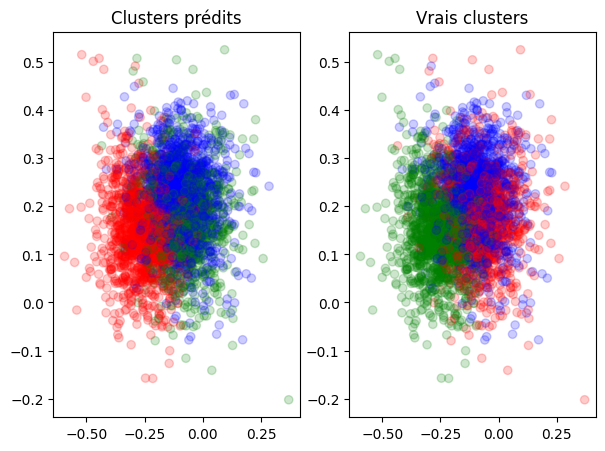

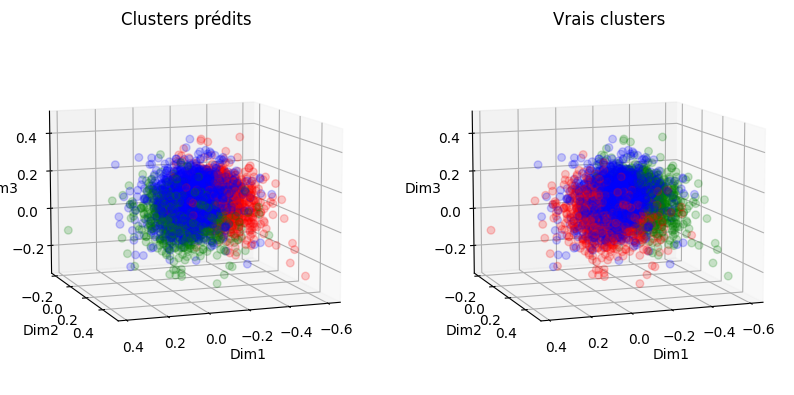

In [ ]:
# KMeans++
kmeans = KMeans(n_clusters=3, init='k-means++', n_init='auto', random_state=7)
kmeans.fit(array_glove)

# Evaluation de la qualité du clustering
print_metrics(kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_glove, kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_glove, kmeans.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.809491767450781
Accuracy:  0.9498843484965305
ARI:  0.8603888535211925


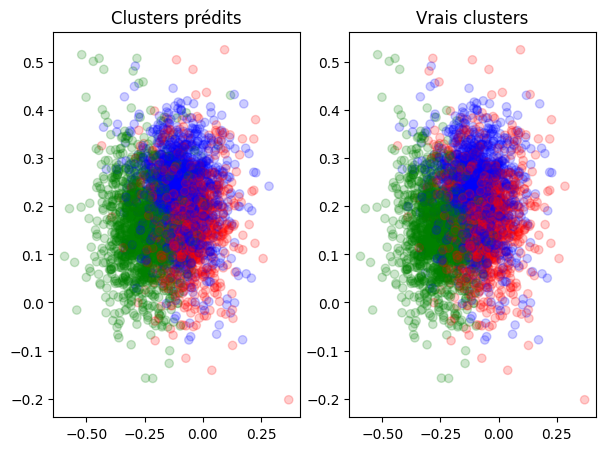

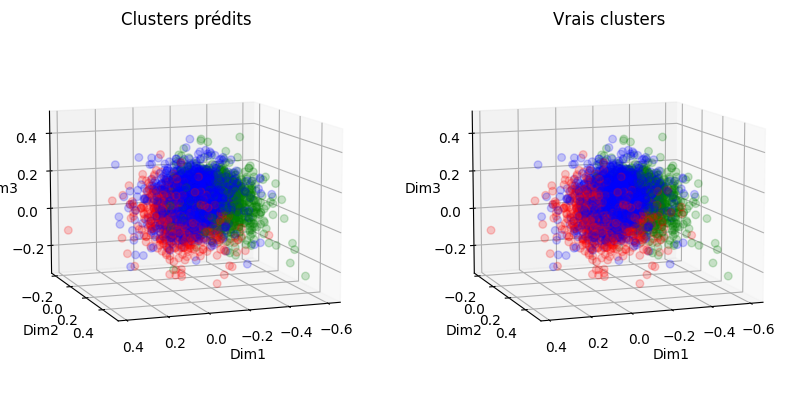

In [ ]:
# KMedoids 
kmedoids = KMedoids(n_clusters=3, random_state=7)
kmedoids.fit(array_glove)

# Evaluation de la qualité du clustering
print_metrics(kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_glove, kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_glove, kmedoids.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.835248800127874
Accuracy:  0.3775379079928039
ARI:  0.8815053214379639


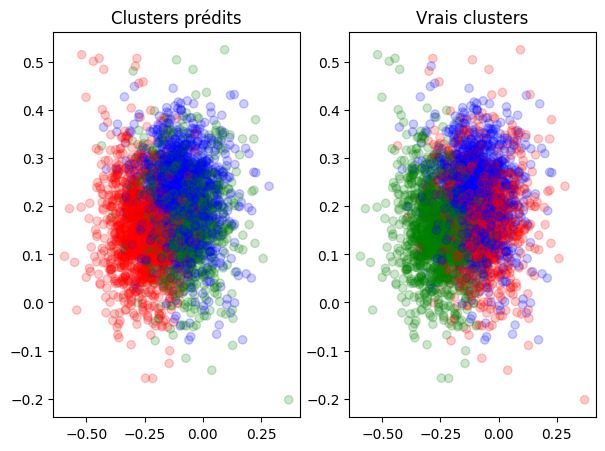

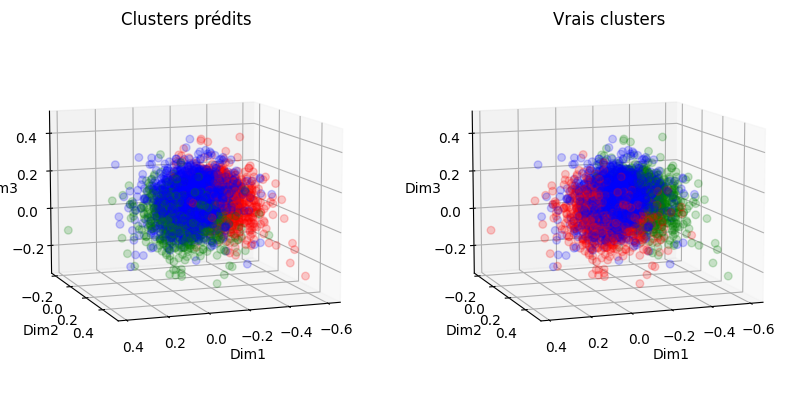

In [ ]:
# Spherical KMeans
skmeans = SphericalKMeans(n_clusters=3, random_state=7)
skmeans.fit(csr_matrix(array_glove))

# Evaluation de la qualité du clustering
print_metrics(skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_glove, skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_glove, skmeans.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.0011057821616722544
Accuracy:  0.375224877923413
ARI:  8.711202434485509e-05


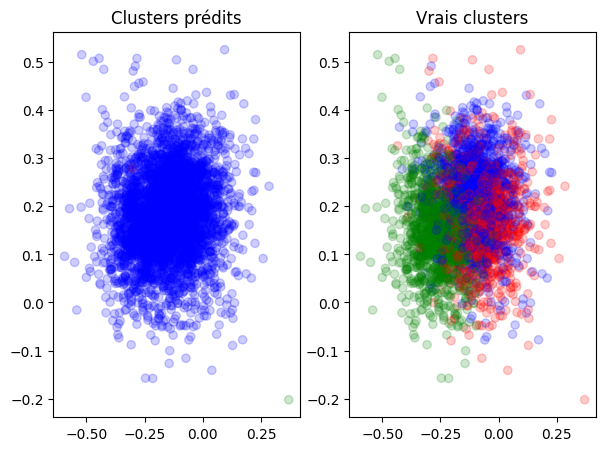

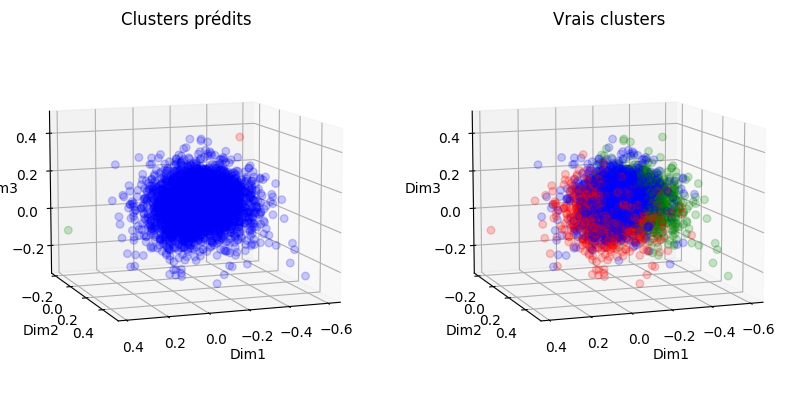

In [ ]:
# HAC/CAH avec lien simple
hac_single = AgglomerativeClustering(n_clusters=3, linkage='single') 
hac_single.fit(array_glove)

# Evaluation de la qualité du clustering
print_metrics(hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_glove, hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_glove, hac_single.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.39607347003623566
Accuracy:  0.5867386276021588
ARI:  0.24761545544163172


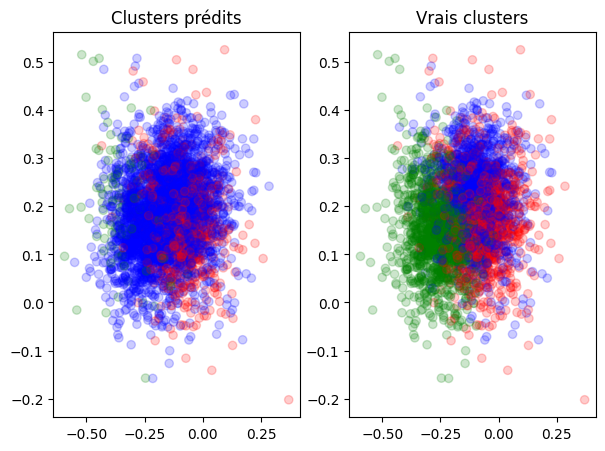

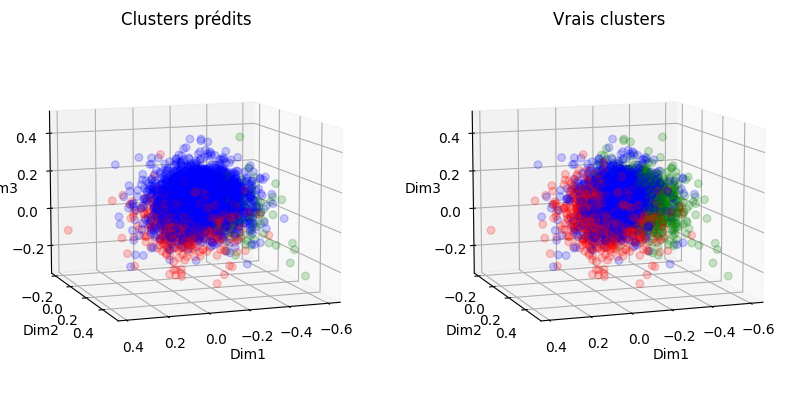

In [ ]:
# HAC/CAH avec lien complet
hac_complete = AgglomerativeClustering(n_clusters=3, linkage='complete') 
hac_complete.fit(array_glove)

# Evaluation de la qualité du clustering
print_metrics(hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_glove, hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_glove, hac_complete.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.0029644060473259216
Accuracy:  0.37650989462863016
ARI:  0.0004404761213882401


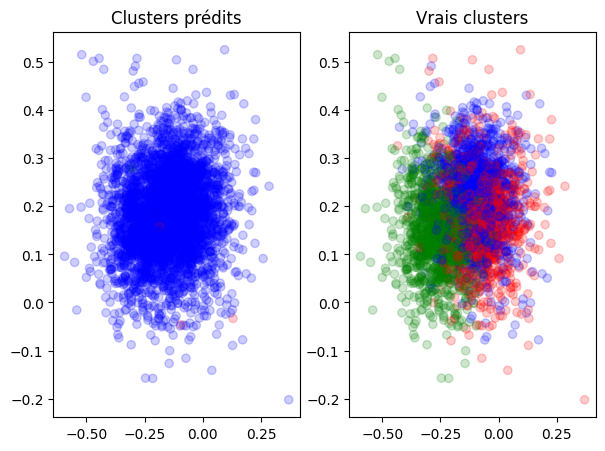

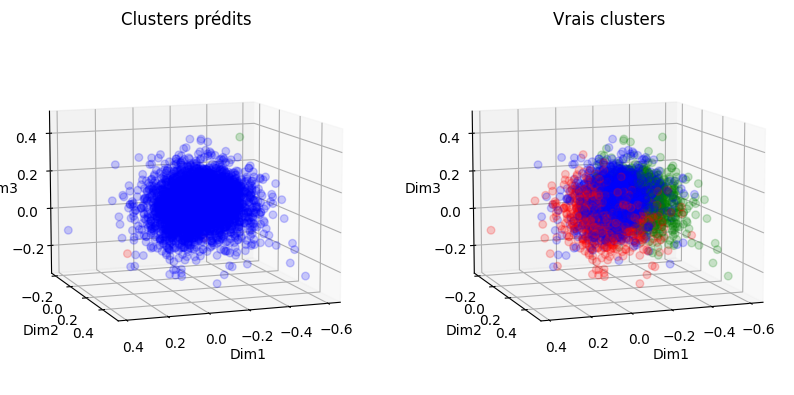

In [ ]:
# HAC/CAH avec lien moyen
hac_avg = AgglomerativeClustering(n_clusters=3, linkage='average') 
hac_avg.fit(array_glove)

# Evaluation de la qualité du clustering
print_metrics(hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_glove, hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_glove, hac_avg.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.9109415133811611
Accuracy:  0.37265484451297864
ARI:  0.9472881722506163


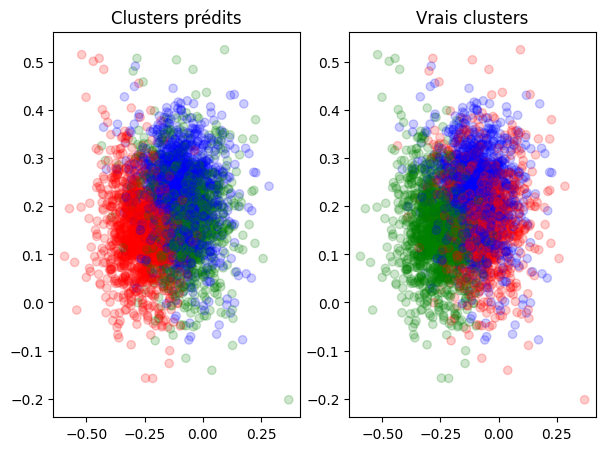

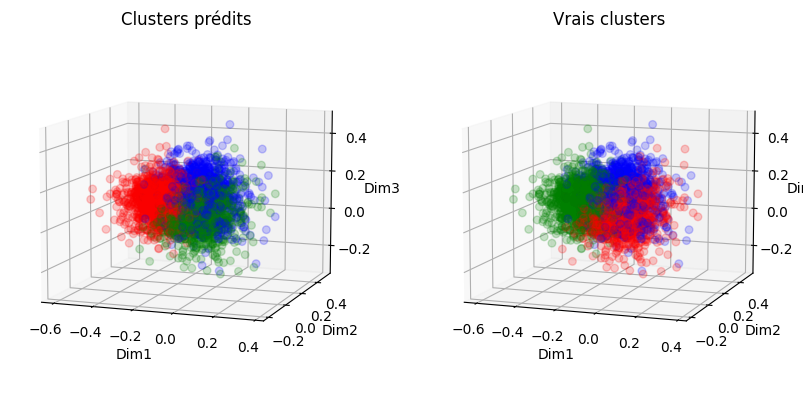

In [ ]:
# HAC/CAH avec lien de Ward
hac_ward = AgglomerativeClustering(n_clusters=3, linkage='ward') 
hac_ward.fit(array_glove)

# Evaluation de la qualité du clustering
print_metrics(hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(array_glove, hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(array_glove, hac_ward.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

Sur l'espace d'origine et avec le vrai nombre de classes, les méthodes de la famille KMeans performent très bien. Les CAH n'ont pas de bons résultats sauf avec le critère de Ward car il recherche des clusters de forme sphérique, et nos données ont cette forme. Totuefois les clusters ne sont pas bien séparés, les techniques de réduction de dimension permettrons peut être de trouver un meilleur sous-espace. 

## Clustering après réduction de dimension

### PCA

PC1     28.336706
PC2     13.086030
PC3      7.067415
PC4      4.431742
PC5      3.732953
PC6      2.954995
PC7      2.392890
PC8      2.189692
PC9      1.944473
PC10     1.878255
dtype: float64


<Axes: xlabel='Principal components', ylabel='Explained variance'>

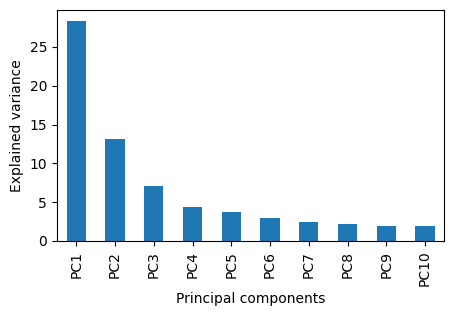

In [ ]:
# Réduction de dimension avec PCA
pca = PCA(random_state=7)
pca_result = pca.fit_transform(array_glove)

# Conversion des résultats en dataframe
pca_columns = ['PC' + str(c) for c in range(1, pca_result.shape[1]+1, 1)]
df_pca = pd.DataFrame(pca_result, index=X_glove.index, columns=pca_columns) 

# Affichage  du pourcentage de variance expliquée par les 10 premières composantes principales
explained_variance = pd.Series(dict(zip(df_pca.columns, 100.0*pca.explained_variance_ratio_)))
print(explained_variance[0:10])
explained_variance[0:10].plot(kind='bar', figsize=(5, 3), rot=90, ylabel='Explained variance', xlabel='Principal components')

Les trois premières composantes expliquent 48% de la variance. C'est beaucoup moins qu'avec les embeddings Word2Vec. La méthode du coude recommande de poursuivre seulement avec les trois premières composantes.



<Axes: xlabel='PC1', ylabel='PC2'>

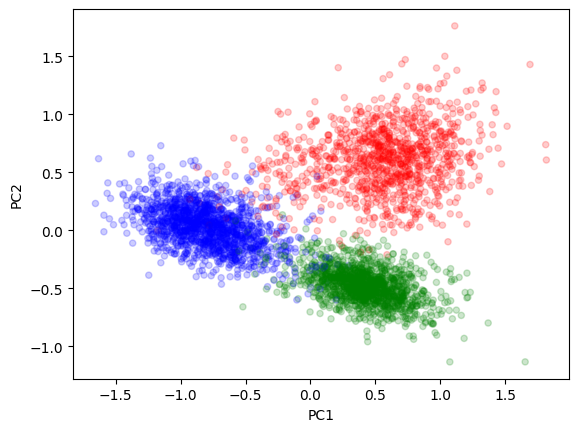

In [ ]:
# Réduction de dimension avec PCA
pca = PCA(n_components=3, random_state=7)
pca_result = pca.fit_transform(array_glove)

# Conversion des résultats en dataframe
pca_columns = ['PC' + str(c) for c in range(1, pca_result.shape[1]+1, 1)]
df_pca = pd.DataFrame(pca_result, index=X_glove.index, columns=pca_columns) 

# Affichage de l'espace réduit en 2D
fig, axs = figsize=(3, 3)
df_pca.plot(x='PC1', y='PC2', kind='scatter', color=y_colors, alpha=0.2)

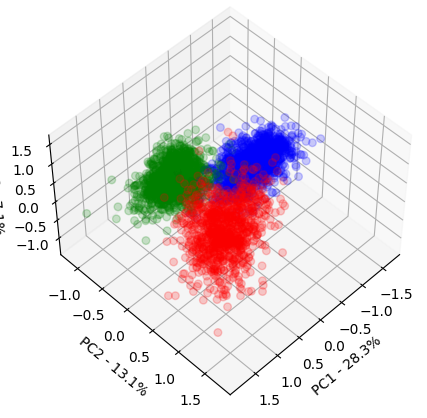

In [ ]:
# Affichage de l'espace réduit en 3D
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_pca['PC1'], df_pca['PC2'], df_pca['PC3'], 
           marker='o', s=30, facecolor=y_colors, alpha=0.2)
ax.set_xlabel('PC1 - ' + '{:.1f}%'.format(explained_variance['PC1']))
ax.set_ylabel('PC2 - ' + '{:.1f}%'.format(explained_variance['PC2']))
ax.set_zlabel('PC3 - ' + '{:.1f}%'.format(explained_variance['PC3']))
ax.view_init(elev=50, azim=45)

On constate que les classes sont plus difficiles à distinguer.

NMI score:  0.8392017609972047
Accuracy:  0.9606784888203547
ARI:  0.8863112163787569


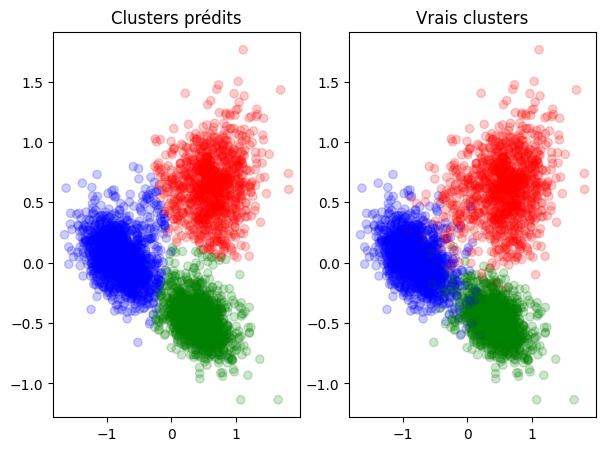

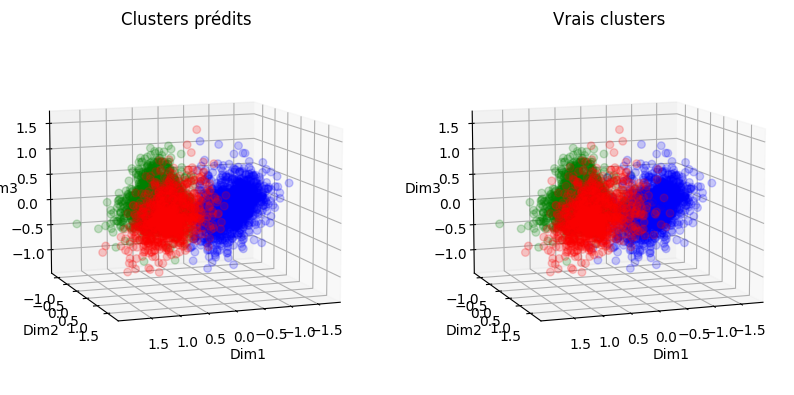

In [ ]:
# KMeans++
pca_kmeans = KMeans(n_clusters=3, init='k-means++', n_init='auto', random_state=7)
pca_kmeans.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_kmeans.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.4981064934943489
Accuracy:  0.026214340786430222
ARI:  0.41873587921794864


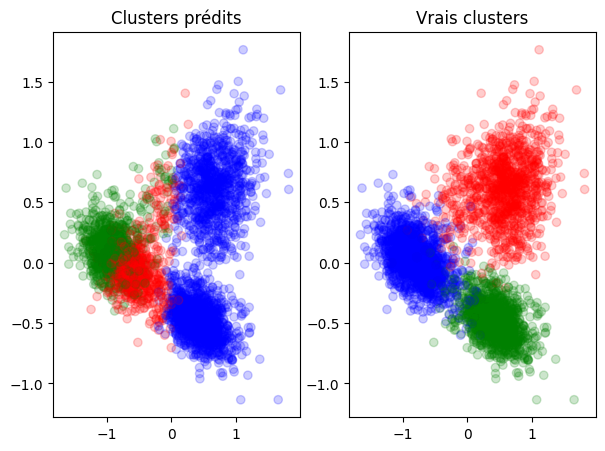

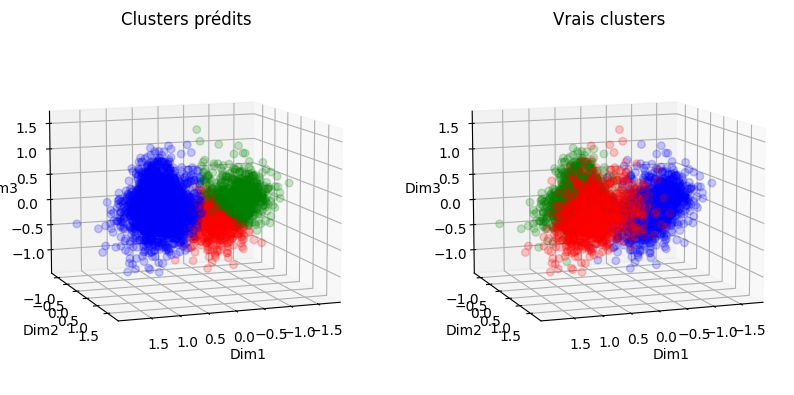

In [ ]:
# KMedoids 
pca_kmedoids = KMedoids(n_clusters=3, random_state=7)
pca_kmedoids.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_kmedoids.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.473667551706798
Accuracy:  0.5636083269082498
ARI:  0.40487738904164466


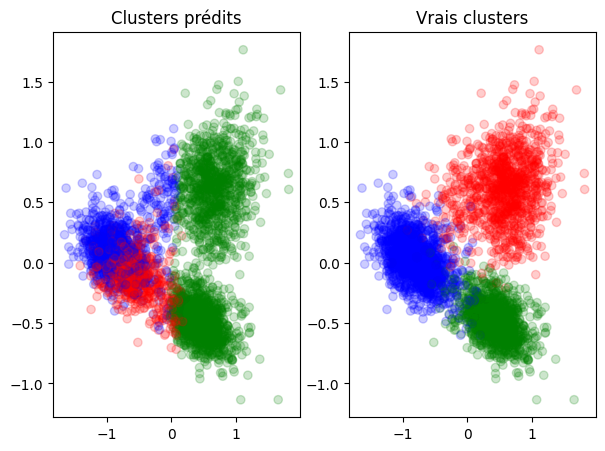

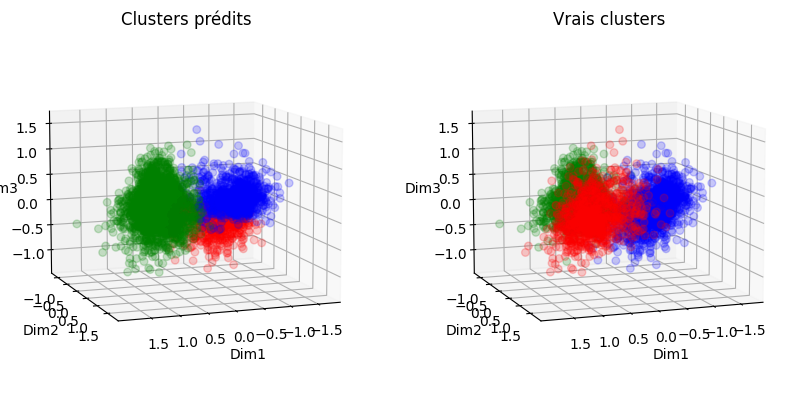

In [ ]:
# Spherical KMeans
pca_skmeans = SphericalKMeans(n_clusters=3, random_state=7)
pca_skmeans.fit(csr_matrix(pca_result))

# Evaluation de la qualité du clustering
print_metrics(pca_skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_skmeans.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.0012486640198584092
Accuracy:  0.3754818812644564
ARI:  0.00023377872988522764


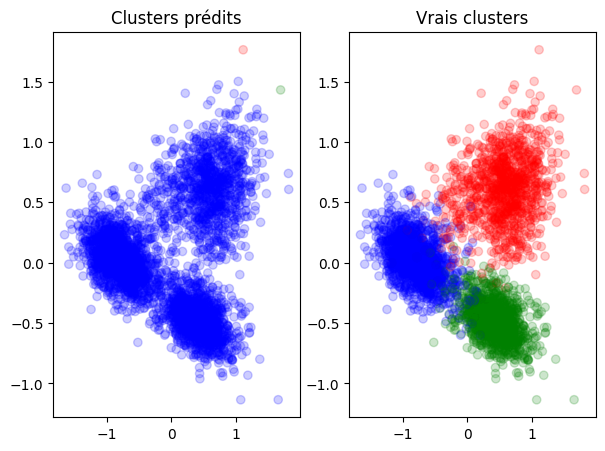

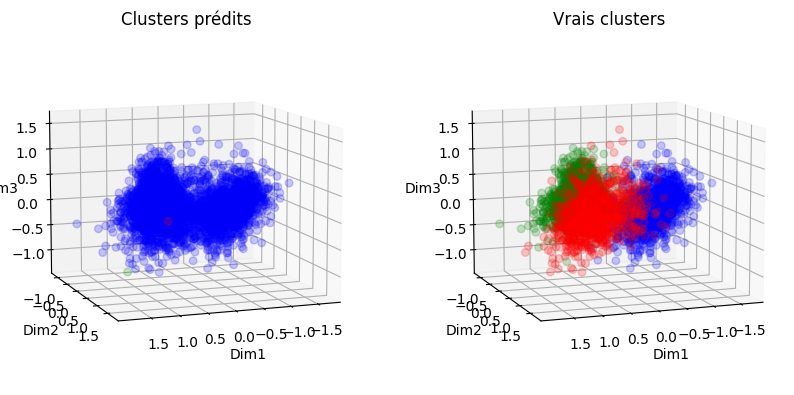

In [ ]:
# HAC/CAH avec lien simple
pca_hac_single = AgglomerativeClustering(n_clusters=3, linkage='single') 
pca_hac_single.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_hac_single.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.4766484392768421
Accuracy:  0.7345155487021331
ARI:  0.3557758596602828


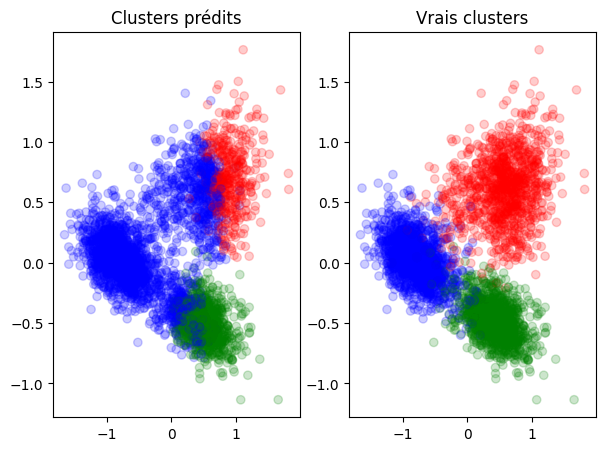

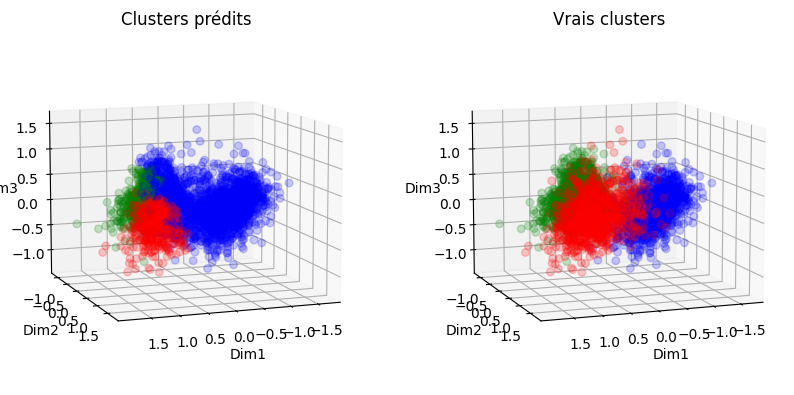

In [ ]:
# HAC/CAH avec lien complet
pca_hac_complete = AgglomerativeClustering(n_clusters=3, linkage='complete') 
pca_hac_complete.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_hac_complete.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.5879042382127907
Accuracy:  0.6042148547931123
ARI:  0.5527181143576522


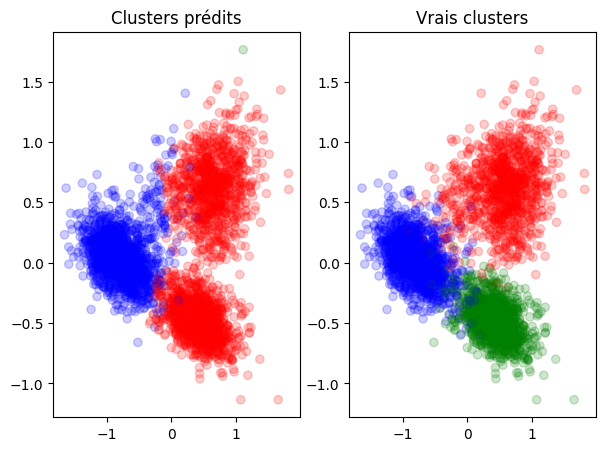

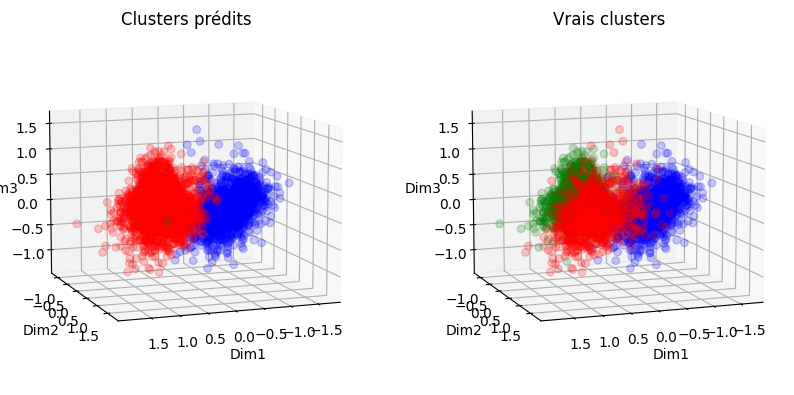

In [ ]:
# HAC/CAH avec lien moyen
pca_hac_avg = AgglomerativeClustering(n_clusters=3, linkage='average') 
pca_hac_avg.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_hac_avg.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.8566632824613263
Accuracy:  0.3592906707787201
ARI:  0.9044909249763773


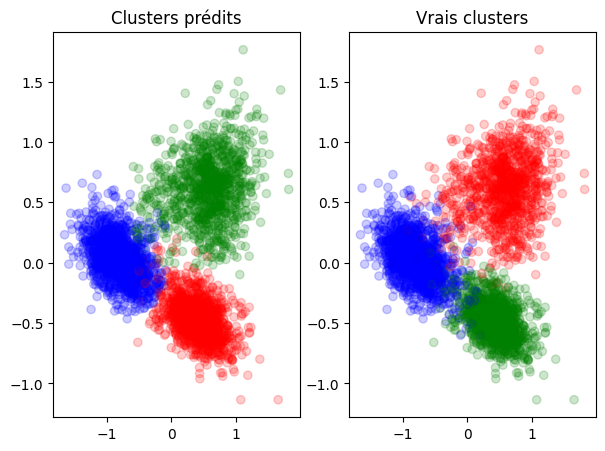

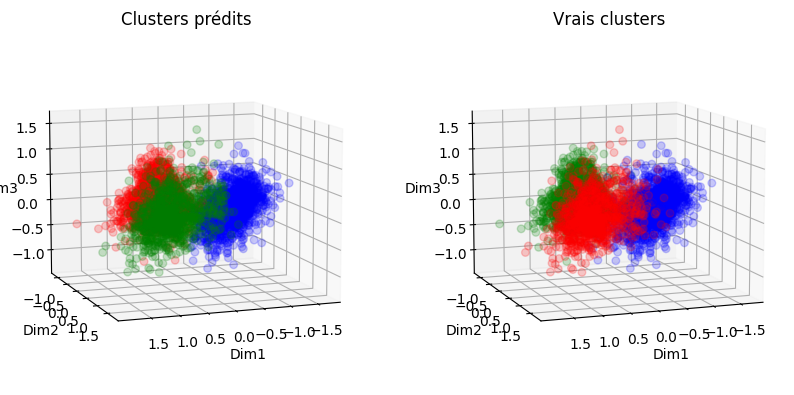

In [ ]:
# HAC/CAH avec lien de Ward
pca_hac_ward = AgglomerativeClustering(n_clusters=3, linkage='ward') 
pca_hac_ward.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(pca_hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(pca_result, pca_hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(pca_result, pca_hac_ward.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

Les clusters sont visuellement plus facilement identifiable mais cet espace réduit ne convient pas à toutes les méthodes. Certaines ont de moins bon scores que dans l'espace d'origine comme KMedoids et Spherical KMeans.

### t-SNE

In [ ]:
# Réduction de dimension avec t-SNE
tsne = TSNE(n_components=3, init='pca', random_state=7)
tsne_result = tsne.fit_transform(array_glove)

# Conversion des résultats en dataframe
tsne_columns = ['Dim' + str(c) for c in range(1, tsne_result.shape[1]+1, 1)]
df_tsne = pd.DataFrame(tsne_result, index=X_glove.index, columns=tsne_columns) 

<Axes: xlabel='Dim1', ylabel='Dim2'>

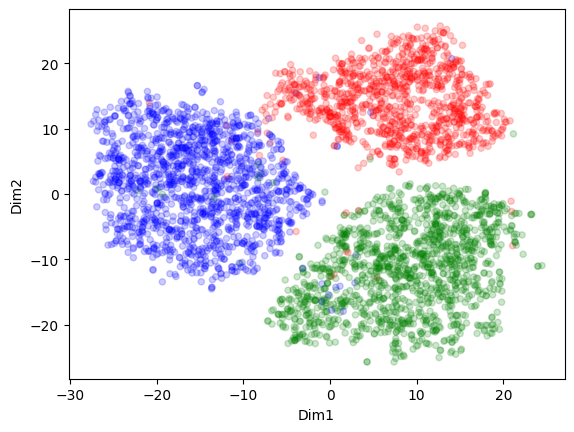

In [ ]:
# Affichage de l'espace réduit en 2D
fig, axs = figsize=(3, 3)
df_tsne.plot(x='Dim1', y='Dim2', kind='scatter', color=y_colors, alpha=0.2)

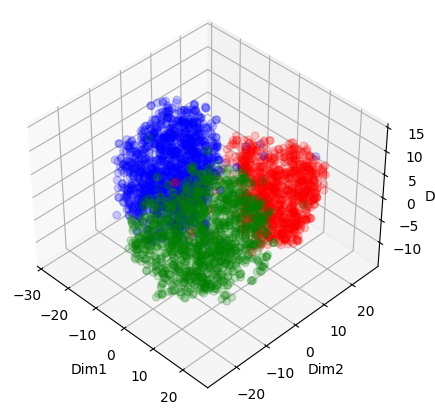

In [ ]:
# Affichage de l'espace réduit en 3D
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(projection='3d')
ax.scatter(df_tsne['Dim1'], df_tsne['Dim2'], df_tsne['Dim3'], 
           marker='o', s=30, facecolor=y_colors, alpha=0.2)
ax.set_xlabel('Dim1')
ax.set_ylabel('Dim2')
ax.set_zlabel('Dim3')
ax.view_init(elev=40, azim=-45)

Globalement les classes sont moins denses et un peu mieux séparées qu'après l'ACP, mais pour la méthode t-SNE cela n'indique pas forcément un meilleur clustering.

NMI score:  0.9267137329850306
Accuracy:  0.986378822924698
ARI:  0.9597234599141301


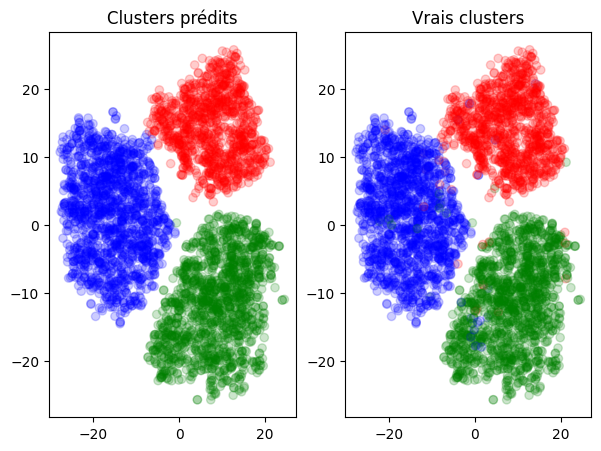

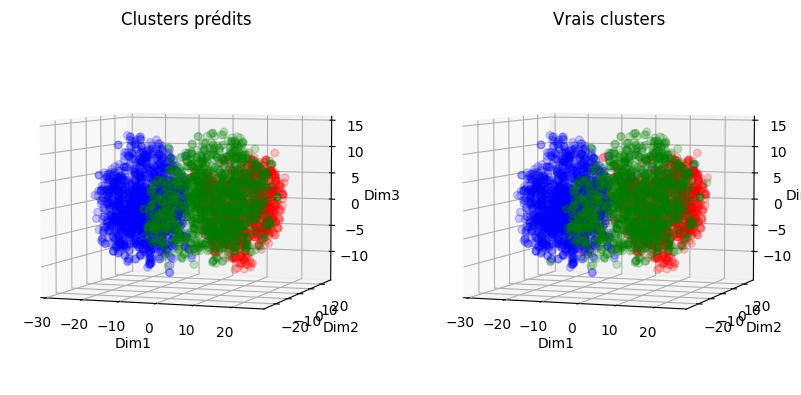

In [ ]:
# KMeans++
tsne_kmeans = KMeans(n_clusters=3, init='k-means++', n_init='auto', random_state=7)
tsne_kmeans.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_kmeans.labels_, elev1=5, azim1=-70, elev2=5, azim2=-70)

NMI score:  0.9153443422422352
Accuracy:  0.006682086867129272
ARI:  0.953471530863756


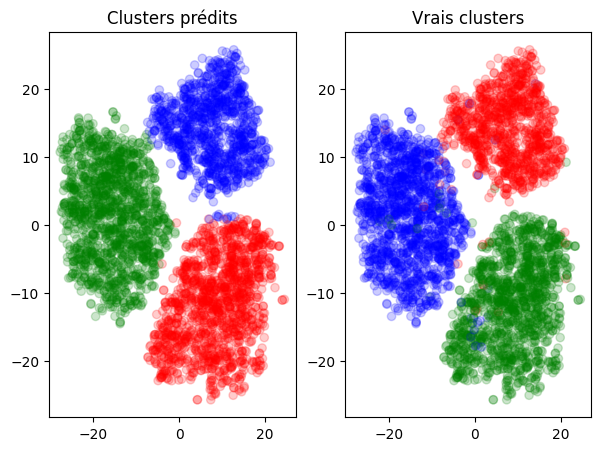

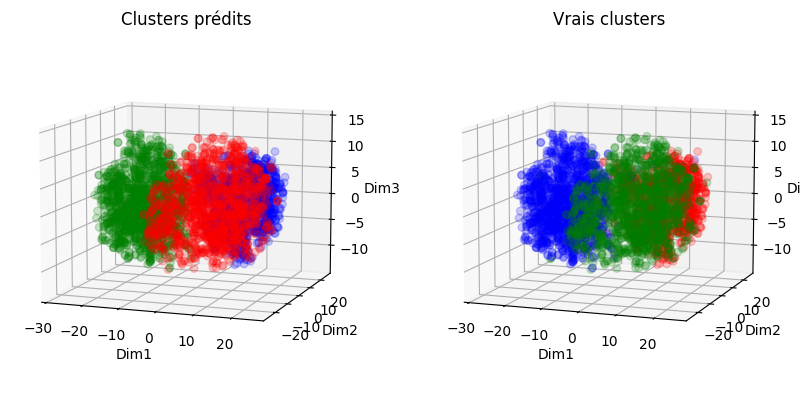

In [ ]:
# KMedoids 
tsne_kmedoids = KMedoids(n_clusters=3, random_state=7)
tsne_kmedoids.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_kmedoids.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

NMI score:  0.9237357783171567
Accuracy:  0.9858648162426111
ARI:  0.9582096778428497


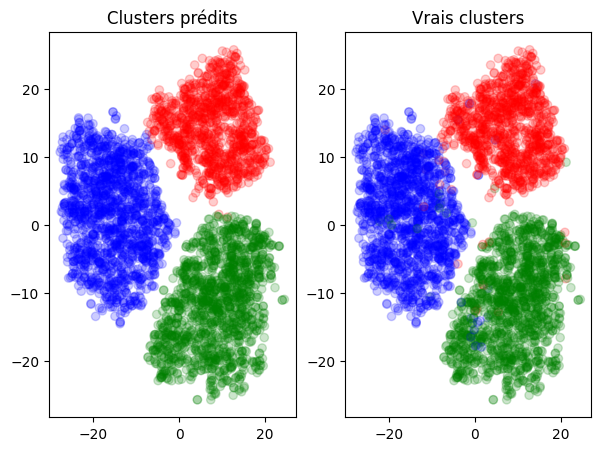

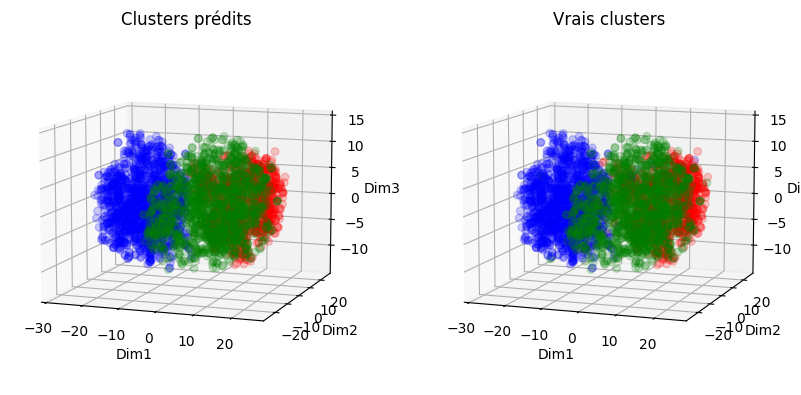

In [ ]:
# Spherical KMeans
tsne_skmeans = SphericalKMeans(n_clusters=3, random_state=7)
tsne_skmeans.fit(csr_matrix(tsne_result))

# Evaluation de la qualité du clustering
print_metrics(tsne_skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_skmeans.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

NMI score:  0.0028730784690505586
Accuracy:  0.3759958879465433
ARI:  -0.0001716712665097779


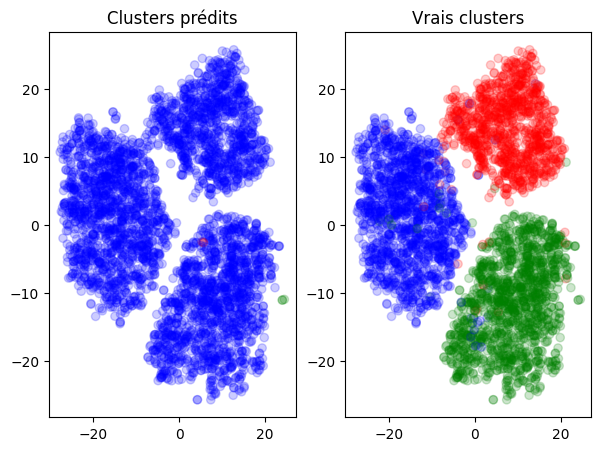

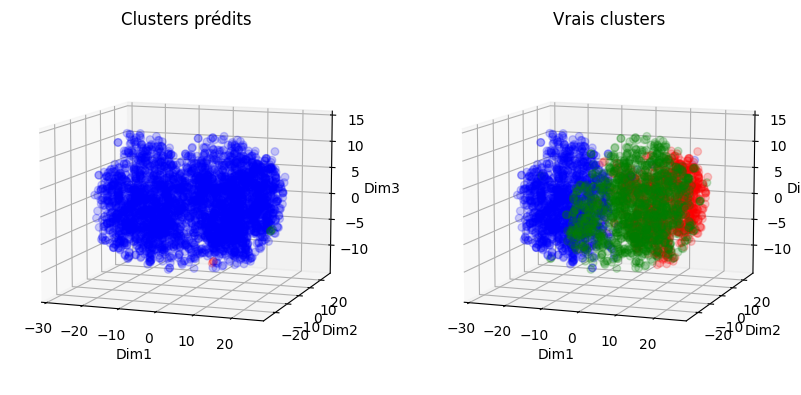

In [ ]:
# HAC/CAH avec lien simple
tsne_hac_single = AgglomerativeClustering(n_clusters=3, linkage='single') 
tsne_hac_single.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_hac_single.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

NMI score:  0.9285239393640949
Accuracy:  0.26548445129786685
ARI:  0.9609361980079454


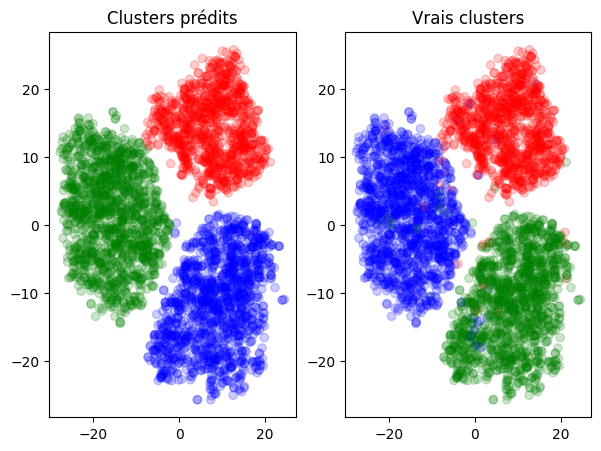

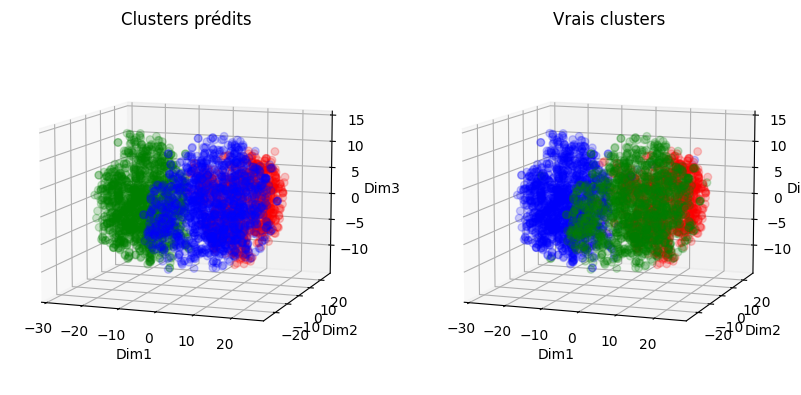

In [ ]:
# HAC/CAH avec lien complet
tsne_hac_complete = AgglomerativeClustering(n_clusters=3, linkage='complete') 
tsne_hac_complete.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_hac_complete.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

NMI score:  0.9296371862687067
Accuracy:  0.26522744795682346
ARI:  0.9617620517937606


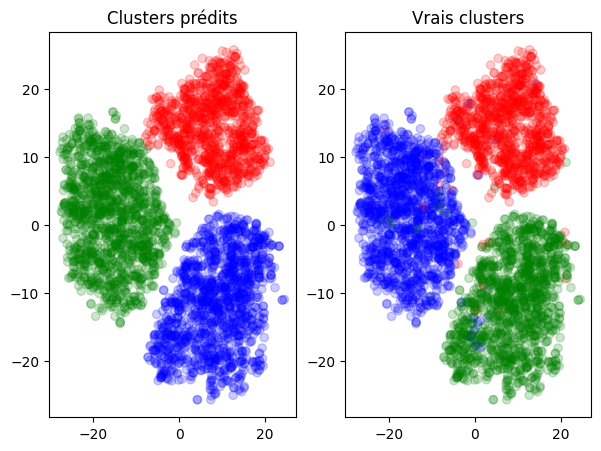

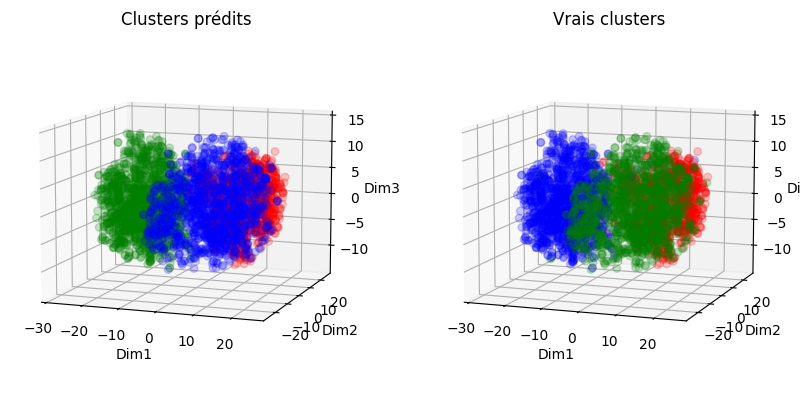

In [ ]:
# HAC/CAH avec lien moyen
tsne_hac_avg = AgglomerativeClustering(n_clusters=3, linkage='average') 
tsne_hac_avg.fit(tsne_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_hac_avg.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

NMI score:  0.8566632824613263
Accuracy:  0.3592906707787201
ARI:  0.9044909249763773


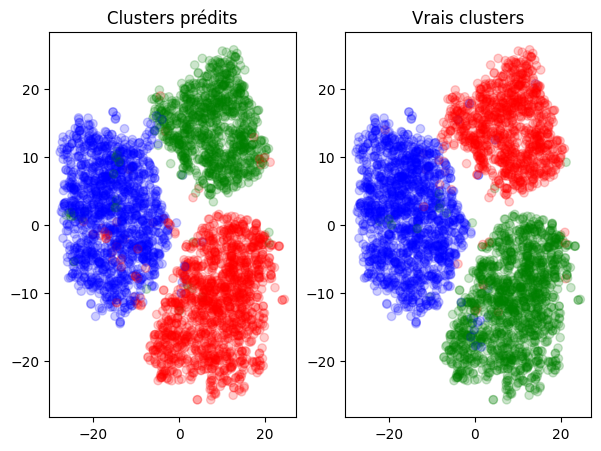

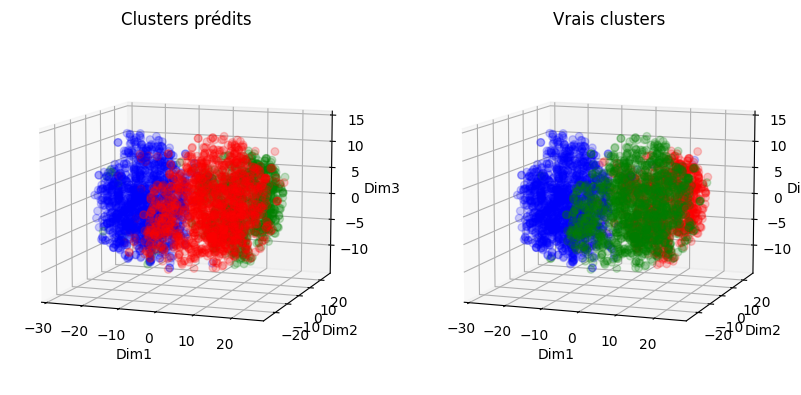

In [ ]:
# HAC/CAH avec lien de Ward
tsne_hac_ward = AgglomerativeClustering(n_clusters=3, linkage='ward') 
tsne_hac_ward.fit(pca_result)

# Evaluation de la qualité du clustering
print_metrics(tsne_hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(tsne_result, tsne_hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(tsne_result, tsne_hac_ward.labels_, elev1=10, azim1=-70, elev2=10, azim2=-70)

Mis à part CAH avec le lien simple toutes les méthodes trouvent de très bon clusters dans cet espace.

### UMAP

In [ ]:
# Réduction de dimension avec UMAP
umap = UMAP(n_components=3, random_state=7)
umap_result = umap.fit_transform(array_glove)

# Conversion des résultats en dataframe
umap_columns = ['Dim' + str(c) for c in range(1, umap_result.shape[1]+1, 1)]
df_umap = pd.DataFrame(umap_result, index=X_glove.index, columns=umap_columns)

<Axes: xlabel='Dim1', ylabel='Dim2'>

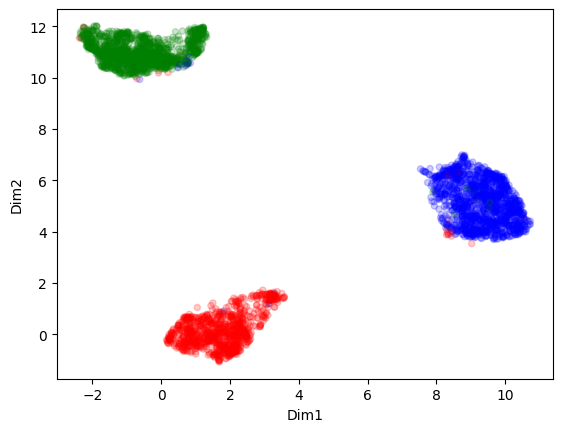

In [ ]:
# Affichage de l'espace réduit en 2D
fig, axs = figsize=(3, 3)
df_umap.plot(x='Dim1', y='Dim2', kind='scatter', color=y_colors, alpha=0.2)

Les 3 groupes sont denses et séparés. Quelques éléments sont dans le mauvais cluster. Ces résultats semblent être les meilleurs obtenus jusqu'à présent.

NMI score:  0.932573621843416
Accuracy:  0.9874068362888717
ARI:  0.9623353889591596


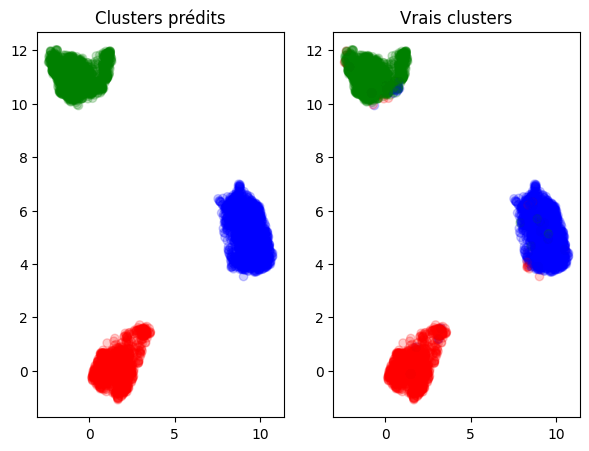

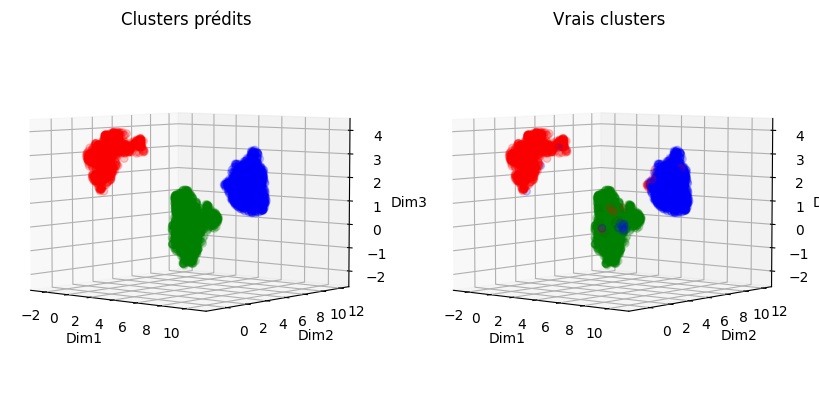

In [ ]:
# KMeans++
umap_kmeans = KMeans(n_clusters=3, init='k-means++', n_init='auto', random_state=7)
umap_kmeans.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_kmeans.labels_, elev1=5, azim1=-50, elev2=5, azim2=-50)

NMI score:  0.9325736218434159
Accuracy:  0.3736828578771524
ARI:  0.9623353889591596


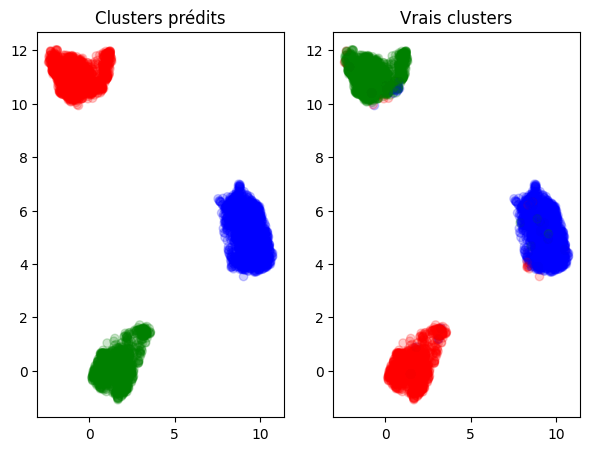

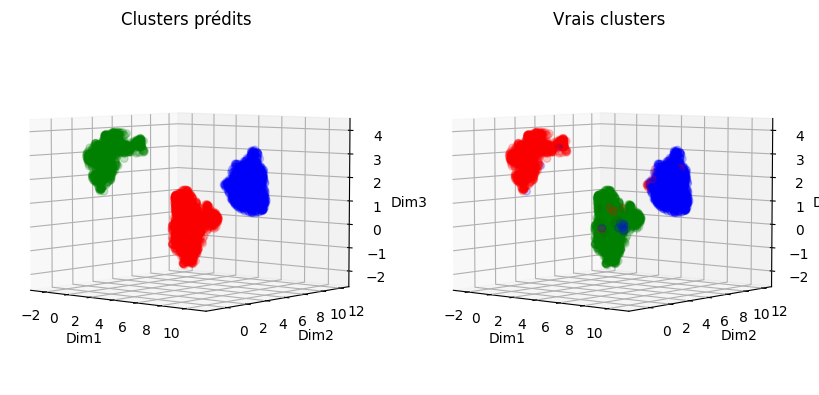

In [ ]:
# KMedoids 
umap_kmedoids = KMedoids(n_clusters=3, random_state=7)
umap_kmedoids.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_kmedoids.labels_, elev1=5, azim1=-50, elev2=5, azim2=-50)

NMI score:  0.9325736218434159
Accuracy:  0.3736828578771524
ARI:  0.9623353889591596


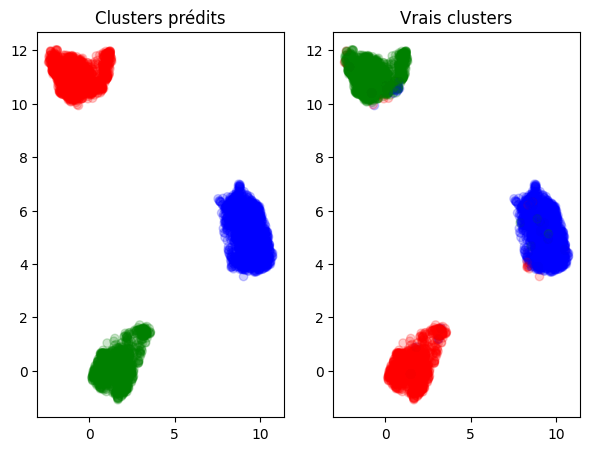

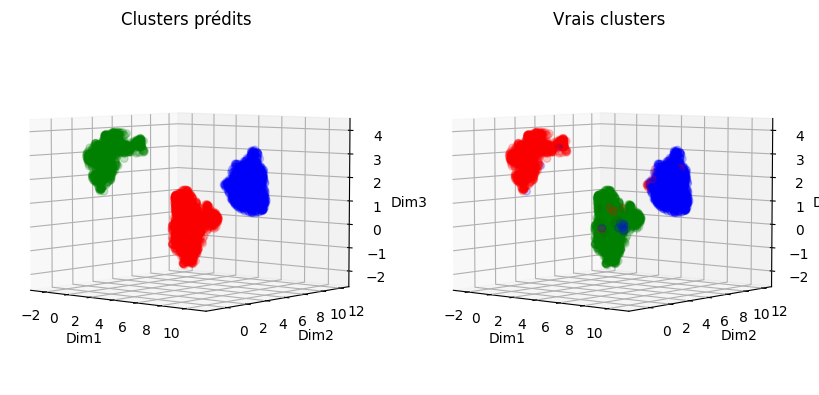

In [ ]:
# Spherical KMeans
umap_skmeans = SphericalKMeans(n_clusters=3, random_state=7)
umap_skmeans.fit(csr_matrix(umap_result))

# Evaluation de la qualité du clustering
print_metrics(umap_skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_skmeans.labels_, elev1=5, azim1=-50, elev2=5, azim2=-50)

NMI score:  0.932573621843416
Accuracy:  0.361603700848111
ARI:  0.9623353889591596


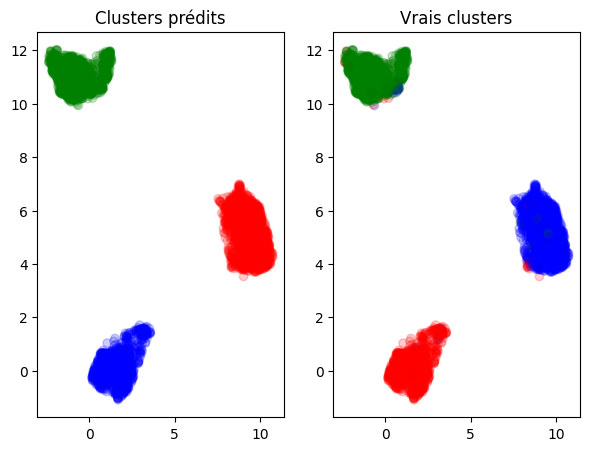

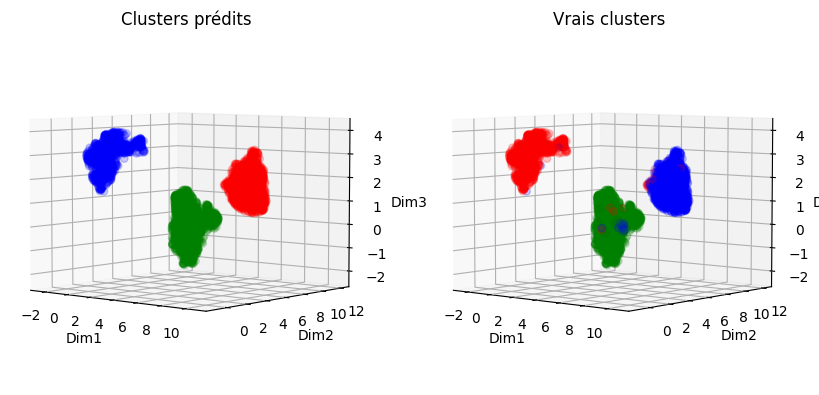

In [ ]:
# HAC/CAH avec lien simple
umap_hac_single = AgglomerativeClustering(n_clusters=3, linkage='single') 
umap_hac_single.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_hac_single.labels_, elev1=5, azim1=-50, elev2=5, azim2=-50)

NMI score:  0.932573621843416
Accuracy:  0.9874068362888717
ARI:  0.9623353889591596


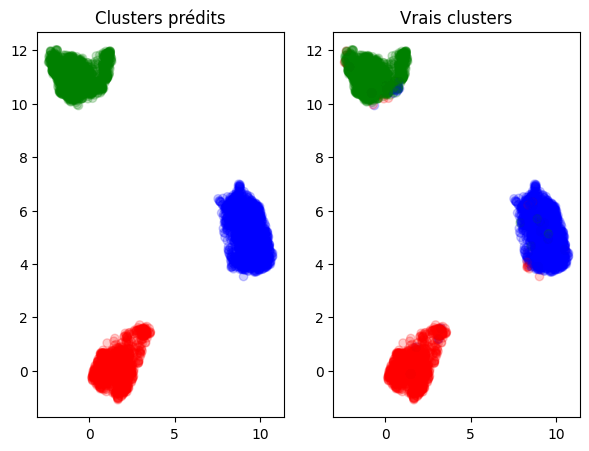

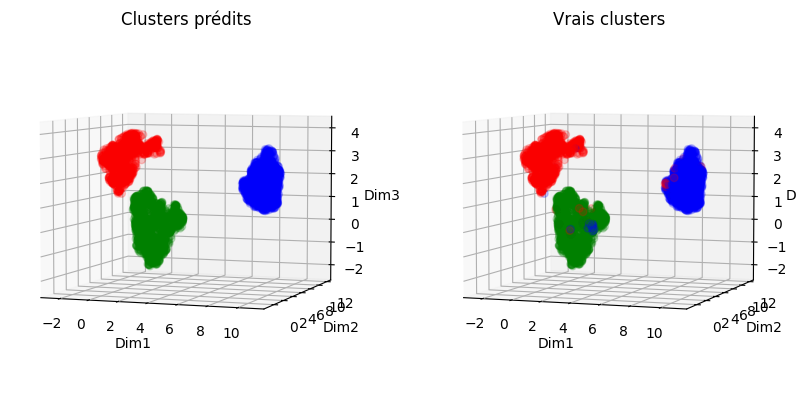

In [ ]:
# HAC/CAH avec lien complet
umap_hac_complete = AgglomerativeClustering(n_clusters=3, linkage='complete') 
umap_hac_complete.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_hac_complete.labels_, elev1=5, azim1=-70, elev2=5, azim2=-70)

NMI score:  0.932573621843416
Accuracy:  0.006682086867129272
ARI:  0.9623353889591596


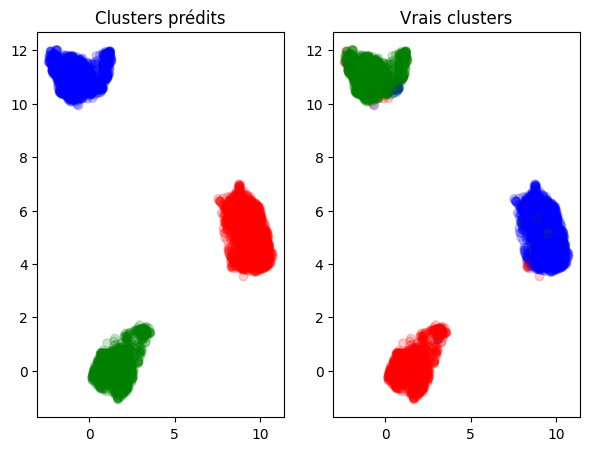

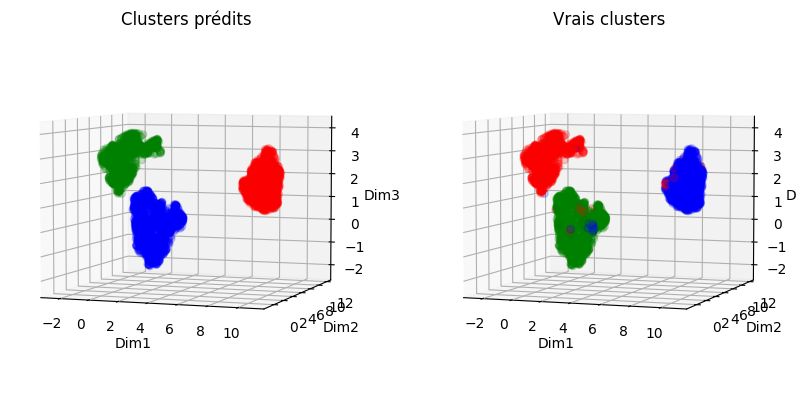

In [ ]:
# HAC/CAH avec lien moyen
umap_hac_avg = AgglomerativeClustering(n_clusters=3, linkage='average') 
umap_hac_avg.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_hac_avg.labels_, elev1=5, azim1=-70, elev2=5, azim2=-70)

NMI score:  0.932573621843416
Accuracy:  0.26471344127473656
ARI:  0.9623353889591596


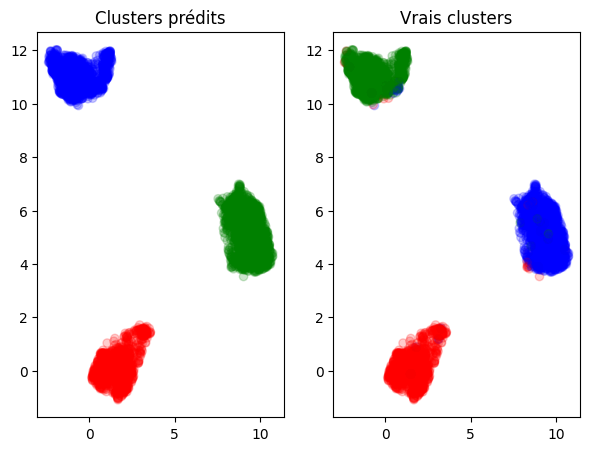

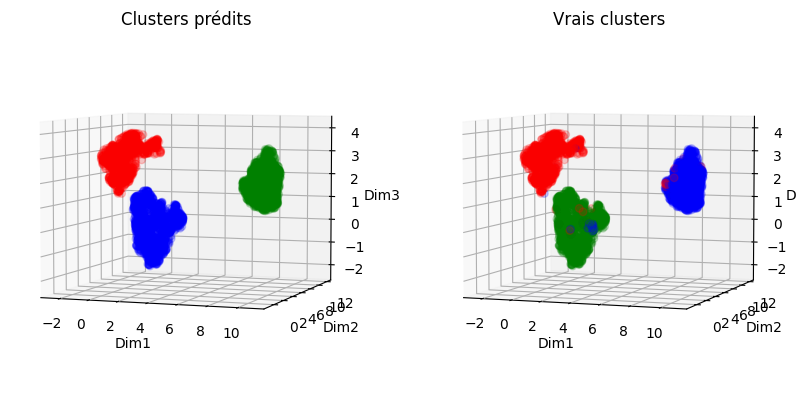

In [ ]:
# HAC/CAH avec lien de Ward
umap_hac_ward = AgglomerativeClustering(n_clusters=3, linkage='ward') 
umap_hac_ward.fit(umap_result)

# Evaluation de la qualité du clustering
print_metrics(umap_hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_hac_ward.labels_, elev1=5, azim1=-70, elev2=5, azim2=-70)

Toutes les méthodes, même CAH avec lien simple trouvent de très bons clusters dans ce sous-espace.

### Autoencoders

In [ ]:
# Réduction de dimension avec Autoencoders
ae_result = autoencoder(array_glove.astype("float32"), embedding_dim=3, seed=7)

# Conversion des résultats en dataframe
ae_columns = ['Dim' + str(c) for c in range(1, ae_result.shape[1]+1, 1)]
df_ae = pd.DataFrame(ae_result, index=X_glove.index, columns=ae_columns)

100%|██████████| 50/50 [00:18<00:00,  2.74it/s]


<Axes: xlabel='Dim1', ylabel='Dim2'>

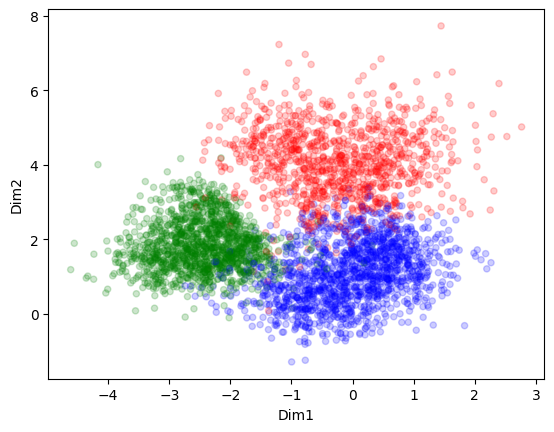

In [ ]:
# Affichage de l'espace réduit en 2D
fig, axs = figsize=(3, 3)
df_ae.plot(x='Dim1', y='Dim2', kind='scatter', color=y_colors, alpha=0.2)

Les groupes sont moins biens distingués. La séparation non linéaire effectuée par les Autoencoders ne semblent pas faire mieux.

NMI score:  0.8452971322031594
Accuracy:  0.9627345155487022
ARI:  0.8908888499621773


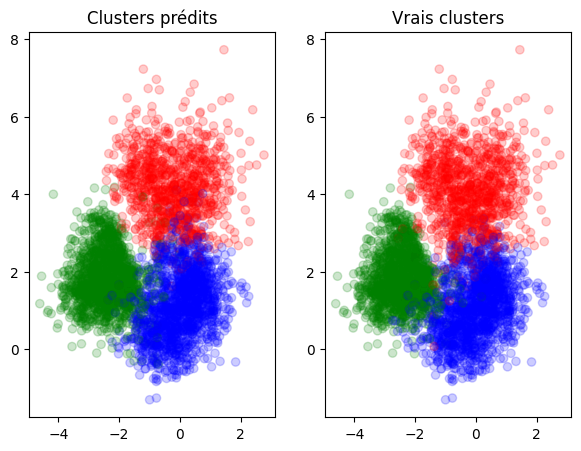

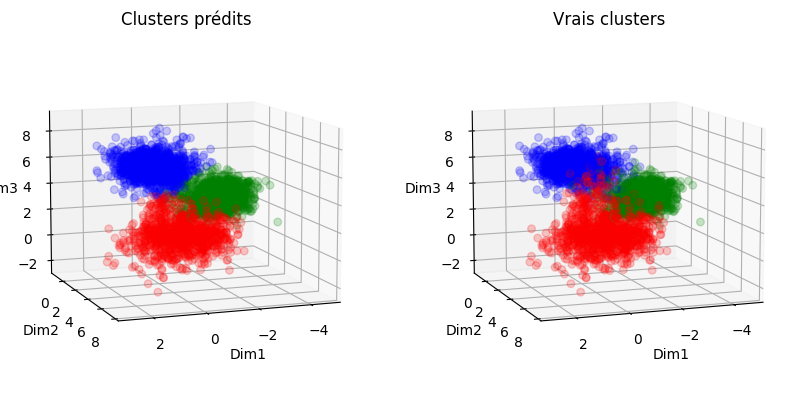

In [ ]:
# KMeans++
ae_kmeans = KMeans(n_clusters=3, init='k-means++', n_init='auto', random_state=7)
ae_kmeans.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_kmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_kmeans.labels_, elev1=10, azim1=70, elev2=10, azim2=70)

NMI score:  0.8424462689333627
Accuracy:  0.36931380107941403
ARI:  0.887379485343355


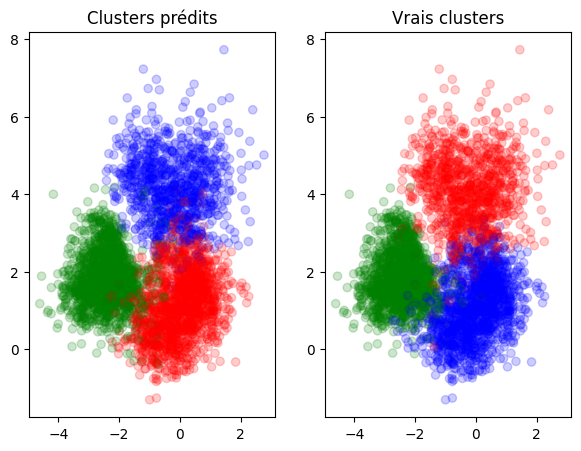

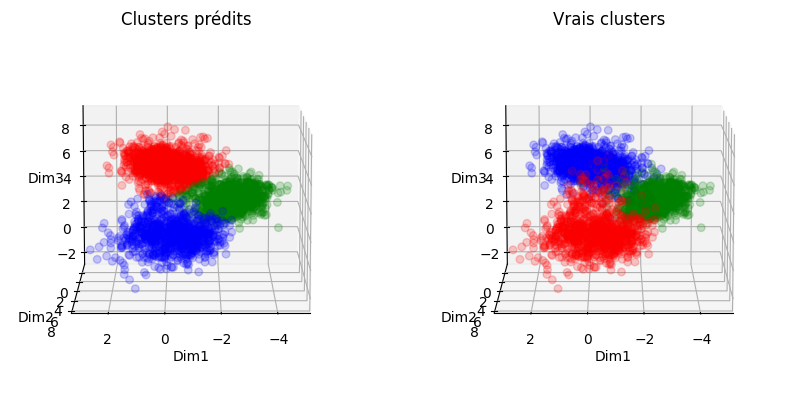

In [ ]:
# KMedoids 
ae_kmedoids = KMedoids(n_clusters=3, random_state=7)
ae_kmedoids.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_kmedoids.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_kmedoids.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_kmedoids.labels_, elev1=10, azim1=90, elev2=10, azim2=90)

NMI score:  0.8451208359535115
Accuracy:  0.3749678745823696
ARI:  0.8908309642363149


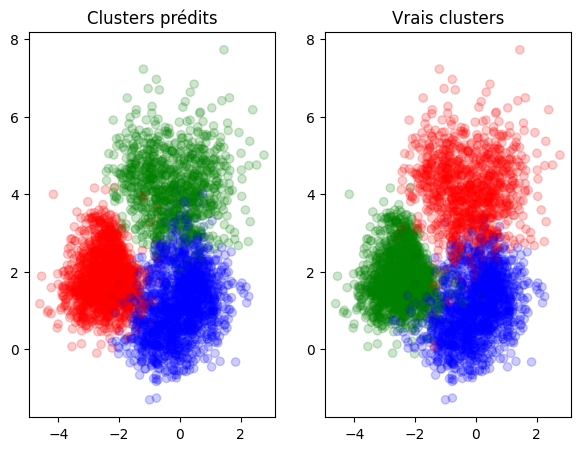

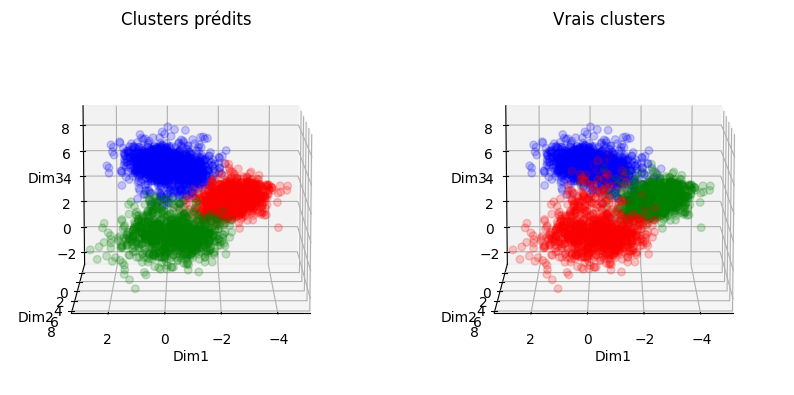

In [ ]:
# Spherical KMeans
ae_skmeans = SphericalKMeans(n_clusters=3, random_state=7)
ae_skmeans.fit(csr_matrix(ae_result))

# Evaluation de la qualité du clustering
print_metrics(ae_skmeans.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_skmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_skmeans.labels_, elev1=10, azim1=90, elev2=10, azim2=90)

NMI score:  0.0011057821616722544
Accuracy:  0.375224877923413
ARI:  8.711202434485509e-05


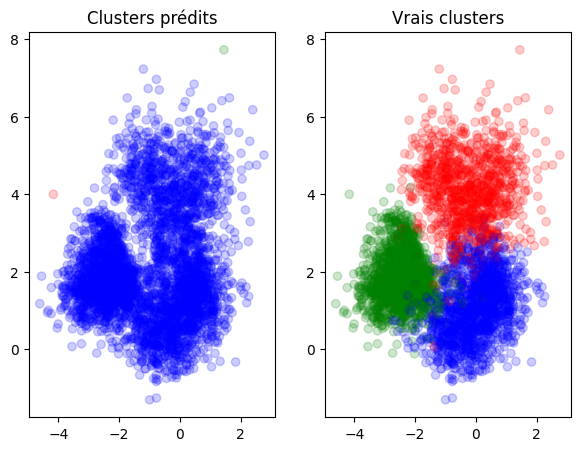

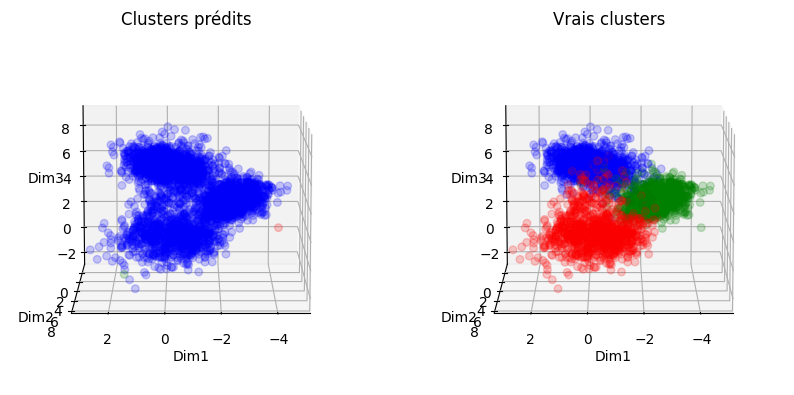

In [ ]:
# HAC/CAH avec lien simple
ae_hac_single = AgglomerativeClustering(n_clusters=3, linkage='single') 
ae_hac_single.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_hac_single.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_hac_single.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_hac_single.labels_, elev1=10, azim1=90, elev2=10, azim2=90)

NMI score:  0.8656847729275213
Accuracy:  0.01824723721408378
ARI:  0.9145186479383517


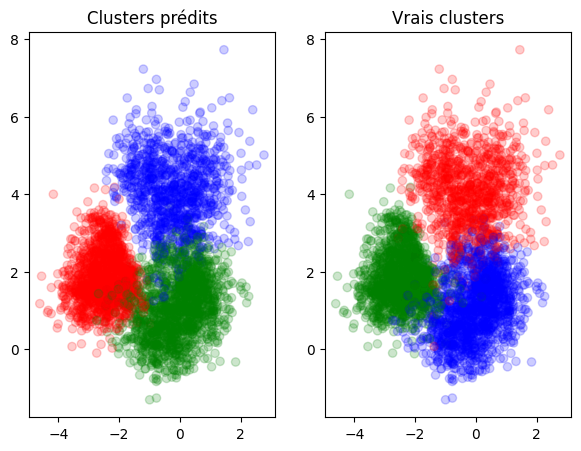

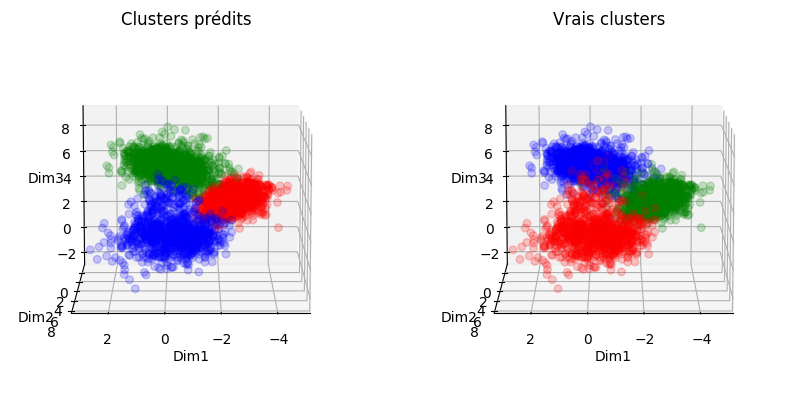

In [ ]:
# HAC/CAH avec lien complet
ae_hac_complete = AgglomerativeClustering(n_clusters=3, linkage='complete') 
ae_hac_complete.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_hac_complete.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_hac_complete.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_hac_complete.labels_, elev1=10, azim1=90, elev2=10, azim2=90)

NMI score:  0.8079545092514078
Accuracy:  0.35569262400411206
ARI:  0.8492576119016974


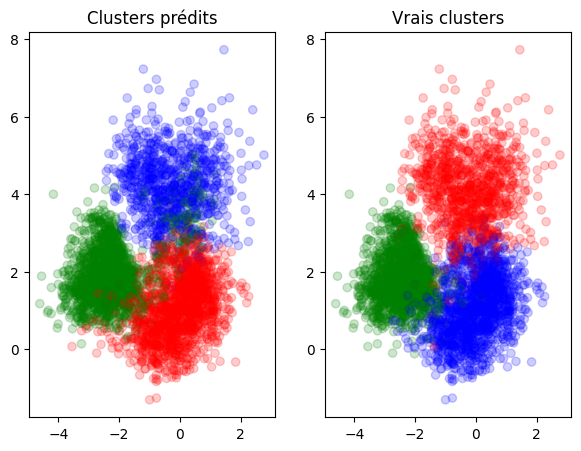

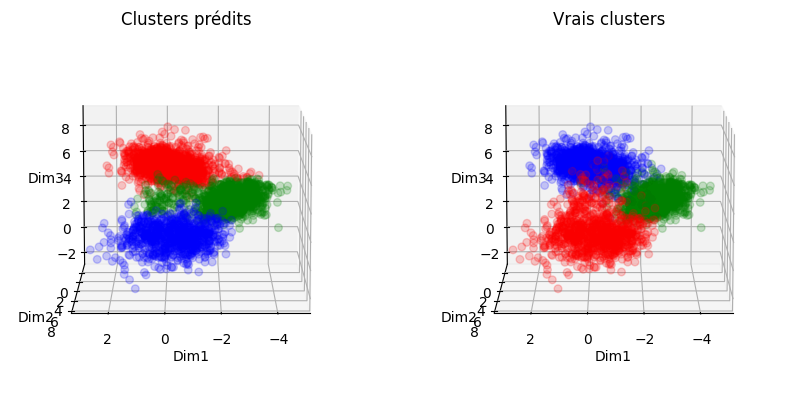

In [ ]:
# HAC/CAH avec lien moyen
ae_hac_avg = AgglomerativeClustering(n_clusters=3, linkage='average') 
ae_hac_avg.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_hac_avg.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_hac_avg.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_hac_avg.labels_, elev1=10, azim1=90, elev2=10, azim2=90)

NMI score:  0.8875580665606443
Accuracy:  0.37034181444358777
ARI:  0.9296516387334093


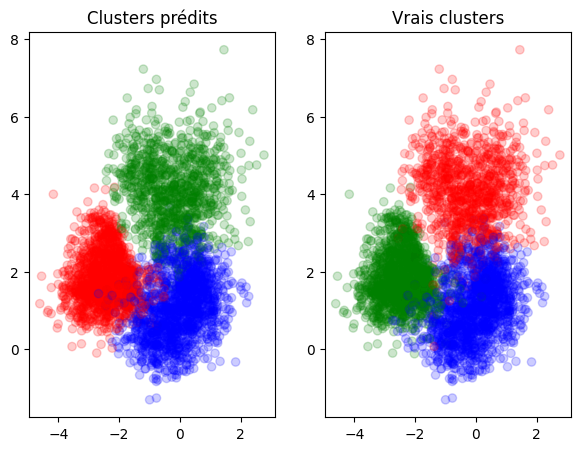

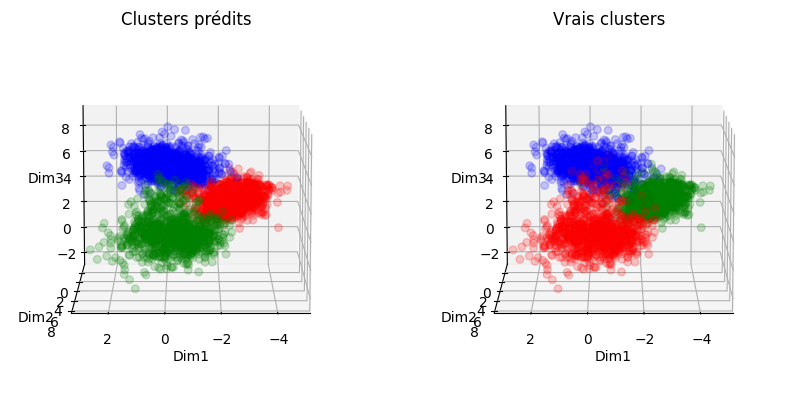

In [ ]:
# HAC/CAH avec lien de Ward
ae_hac_ward = AgglomerativeClustering(n_clusters=3, linkage='ward') 
ae_hac_ward.fit(ae_result)

# Evaluation de la qualité du clustering
print_metrics(ae_hac_ward.labels_, y)

# Comparaison des clusters en 2D 
clust_viz_2D(ae_result, ae_hac_ward.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(ae_result, ae_hac_ward.labels_, elev1=10, azim1=90, elev2=10, azim2=90)

La réduction opéré par les Autoencoders permet d'obtenir de bons clusters, hormis pour CAH avec le lien simple, car ils sont sphériques. Cependant les résultats sont moins élevés qu'en utilisant UMAP.

## Estimation du nombre de classes avec NbClust

Estimation du nombre de classes avec le package R NbClust (avec un critère de distance euclidienne car nous comparons des lignes) 

Lien minimum (single): trouve clusters de formes allongées ou irrégulières mais sensible à l’effet de chaîne.

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 
*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 8 proposed 2 as the best number of clusters 
* 6 proposed 3 as the best number of clusters 
* 2 proposed 4 as the best number of clusters 
* 1 proposed 6 as the best number of clusters 
* 1 proposed 7 as the best number 

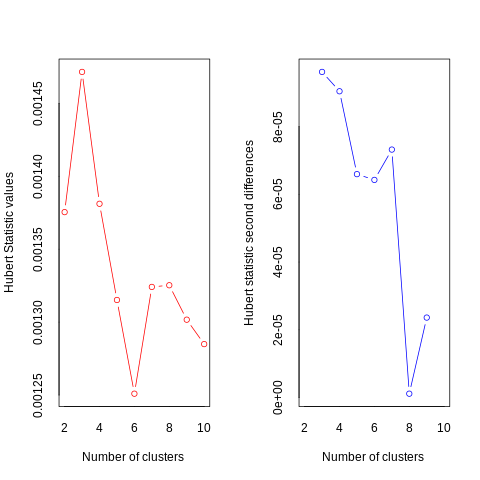

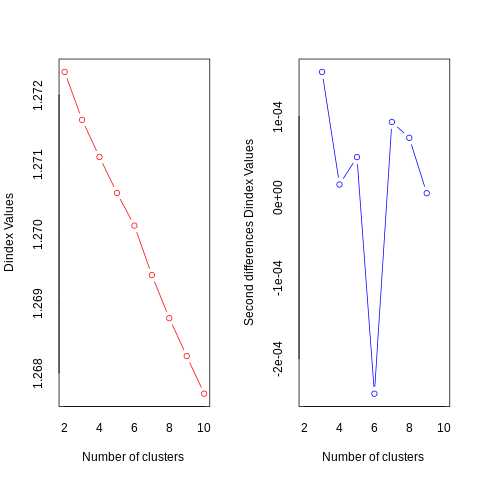

In [ ]:
%%R -i array_glove
res <- NbClust(array_glove, distance="euclidean", min.nc=2, max.nc=10,
               method="single", index="all")

Lien maximum (complete): fusionne les deux groupes qui ont la plus petite distance maximale entre leurs points.

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 
*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 5 proposed 2 as the best number of clusters 
* 2 proposed 3 as the best number of clusters 
* 11 proposed 4 as the best number of clusters 
* 2 proposed 5 as the best number of clusters 
* 1 proposed 8 as the best number

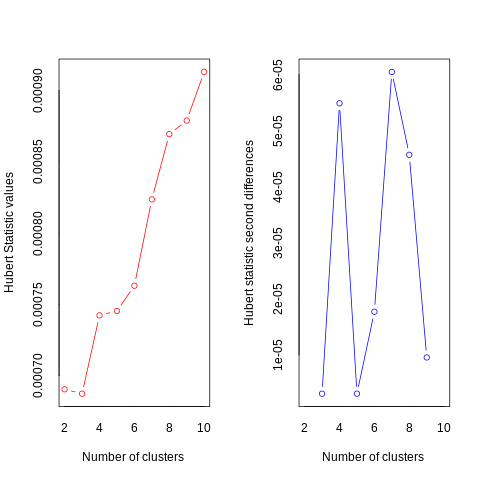

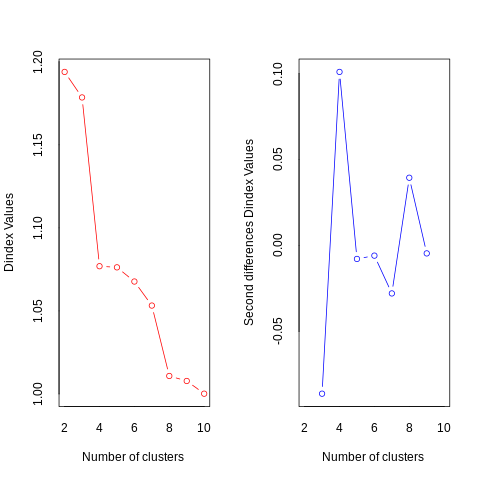

In [ ]:
%%R
res <- NbClust(array_glove, distance = "euclidean", min.nc=2, max.nc=10,
             method = "complete", index = "all")

Lien moyen (average): fusionne les deux groupes qui ont la plus petite distance moyenne entre tous leurs points.

[1] "Frey index : No clustering structure in this data set"
*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 
*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 10 proposed 2 as the best number of clusters 
* 1 proposed 3 as the best number of clusters 
* 1 proposed 5 as the best number of clusters 
* 3 proposed 7 as th

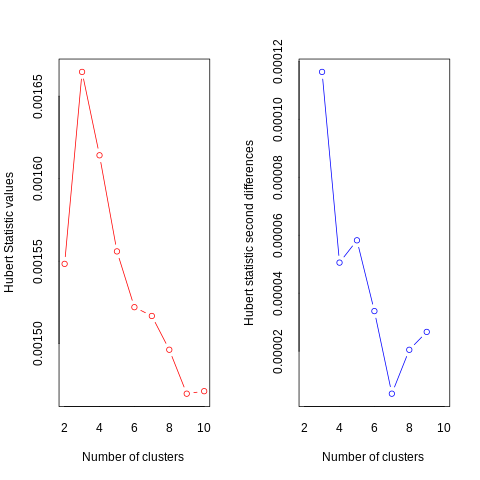

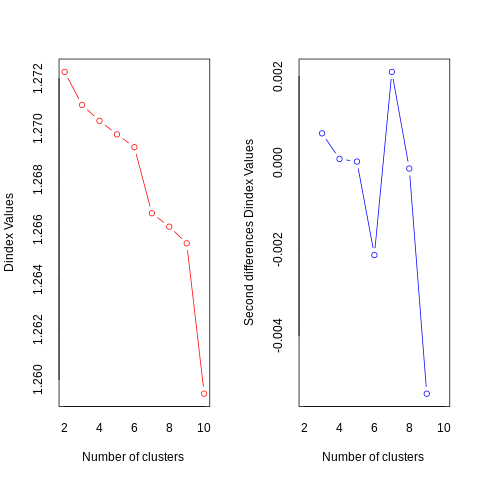

In [ ]:
%%R
res <- NbClust(array_glove, distance = "euclidean", min.nc=2, max.nc=10,
             method = "average", index = "all")

Lien de Ward: choisit les deux groupes à fusionner de manière à ce que la variance au sein de tous les groupes augmente le moins possible. Cela permet souvent d'obtenir des groupes de taille relativement égale. Trouve des clusters de forme sphérique.

*** : The Hubert index is a graphical method of determining the number of clusters.
                In the plot of Hubert index, we seek a significant knee that corresponds to a 
                significant increase of the value of the measure i.e the significant peak in Hubert
                index second differences plot. 
 
*** : The D index is a graphical method of determining the number of clusters. 
                In the plot of D index, we seek a significant knee (the significant peak in Dindex
                second differences plot) that corresponds to a significant increase of the value of
                the measure. 
 
******************************************************************* 
* Among all indices:                                                
* 5 proposed 2 as the best number of clusters 
* 13 proposed 3 as the best number of clusters 
* 1 proposed 4 as the best number of clusters 
* 1 proposed 10 as the best number of clusters 

                   ***** Conclu

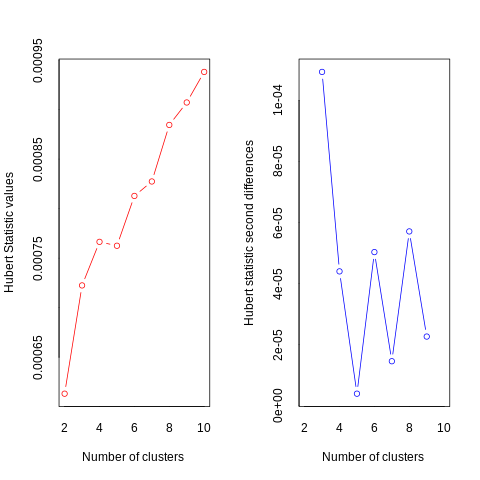

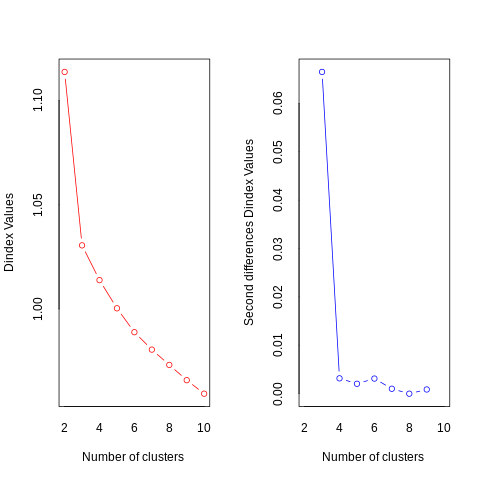

In [ ]:
%%R
res <- NbClust(array_glove, distance = "euclidean", min.nc=2, max.nc=10,
             method = "ward.D", index = "all")

Le nombre de clusters trouvé majoritairement par les différents critères est de 2, mais le lien complet en trouve majoritairement 4 et le lien de Ward 3.


## Synthèse

In [ ]:
# Récupération des résultats des clusterings
preds = [kmeans.labels_, 
         kmedoids.labels_,
         skmeans.labels_,
         hac_single.labels_,
         hac_complete.labels_,
         hac_avg.labels_,
         hac_ward.labels_,
         pca_kmeans.labels_,
         pca_kmedoids.labels_,
         pca_skmeans.labels_,
         pca_hac_single.labels_,
         pca_hac_complete.labels_,
         pca_hac_avg.labels_,
         pca_hac_ward.labels_,
         tsne_kmeans.labels_,
         tsne_kmedoids.labels_,
         tsne_skmeans.labels_,
         tsne_hac_single.labels_,
         tsne_hac_complete.labels_,
         tsne_hac_avg.labels_,
         tsne_hac_ward.labels_,
         umap_kmeans.labels_,
         umap_kmedoids.labels_,
         umap_skmeans.labels_,
         umap_hac_single.labels_,
         umap_hac_complete.labels_,
         umap_hac_avg.labels_,
         umap_hac_ward.labels_,
         ae_kmeans.labels_,
         ae_kmedoids.labels_,
         ae_skmeans.labels_,
         ae_hac_single.labels_,
         ae_hac_complete.labels_,
         ae_hac_avg.labels_,
         ae_hac_ward.labels_]

# Récupération des scores
nmi_scores = [normalized_mutual_info_score(y_pred, y) for y_pred in preds]
accuracy_scores = [accuracy_score(y_pred, y) for y_pred in preds]
ari_scores = [adjusted_rand_score(y_pred, y) for y_pred in preds]

# Nom des méthodes
methods = ["Kmeans++", 
           "Kmedoids", 
           "Spherical Kmeans", 
           "CAH (simple)", 
           "CAH (complet)",
           "CAH (moyen)", 
           "CAH (Ward)",
           "PCA + Kmeans++", 
           "PCA + Kmedoids", 
           "PCA + Spherical Kmeans", 
           "PCA + CAH (simple)", 
           "PCA + CAH (complet)", 
           "PCA + CAH (moyen)", 
           "PCA + CAH (Ward)",
           "t-SNE + Kmeans++",
           "t-SNE + Kmedoids",
           "t-SNE + Spherical Kmeans",
           "t-SNE + CAH (simple)", 
           "t-SNE + CAH (complet)",
           "t-SNE + CAH (moyen)",
           "t-SNE + CAH (Ward)",
           "UMAP + Kmeans++",
           "UMAP + Kmedoids",
           "UMAP + Spherical Kmeans",
           "UMAP + CAH (simple)",
           "UMAP + CAH (complet)",
           "UMAP + CAH (moyen)",
           "UMAP + CAH (Ward)",
           "AE + Kmeans++",
           "AE + Kmedoids",
           "AE + Spherical Kmeans",
           "AE + CAH (simple)",
           "AE + CAH (complet)",
           "AE + CAH (moyen)",
           "AE + CAH (Ward)"]

# Création d'un dataframe
tab = pd.concat([pd.Series(nmi_scores, name="NMI", index=methods),
                 pd.Series(accuracy_scores, name="Accuracy", index=methods),
                 pd.Series(ari_scores, name="ARI", index=methods)],
                axis=1)

# Calcul de la moyenne des scores NMI et ARI
tab["NMI-ARI mean"] = tab[["NMI","ARI"]].mean(axis=1)
tab

,NMI,Accuracy,ARI,NMI-ARI mean
Kmeans++,0.851172,0.372141,0.895813,0.873493
Kmedoids,0.809492,0.949884,0.860389,0.834940
Spherical Kmeans,0.835249,0.377538,0.881505,0.858377
CAH (simple),0.001106,0.375225,0.000087,0.000596
CAH (complet),0.396073,0.586739,0.247615,0.321844
CAH (moyen),0.002964,0.376510,0.000440,0.001702
CAH (Ward),0.910942,0.372655,0.947288,0.929115
PCA + Kmeans++,0.839202,0.960678,0.886311,0.862756
PCA + Kmedoids,0.498106,0.026214,0.418736,0.458421
PCA + Spherical Kmeans,0.473668,0.563608,0.404877,0.439272


Le problème de l'utilisation de la précision est qu'elle exige que les étiquettes de clusters attribuées correspondent exactement à la vérité terrain. Cependant, les étiquettes des clusters ne sont pas significatives en elles-mêmes. La seule chose qui compte est de savoir quels points se trouvent dans le même cluster. 

Il vaut mieux se référer au NMI et ARI. En outre ces métriques donnent un score entre O et 1, 1 étant le maximum. Il est donc possible de calculer la moyenne de ces deux scores pour trouver la combinaison qui donne les meilleurs résultats globaux. 

In [ ]:
# Meilleure combinaison
tab[tab["NMI-ARI mean"]==tab["NMI-ARI mean"].max()]

,NMI,Accuracy,ARI,NMI-ARI mean
UMAP + Kmeans++,0.932574,0.987407,0.962335,0.947455
UMAP + Kmedoids,0.932574,0.373683,0.962335,0.947455
UMAP + Spherical Kmeans,0.932574,0.373683,0.962335,0.947455
UMAP + CAH (simple),0.932574,0.361604,0.962335,0.947455
UMAP + CAH (complet),0.932574,0.987407,0.962335,0.947455
UMAP + CAH (moyen),0.932574,0.006682,0.962335,0.947455
UMAP + CAH (Ward),0.932574,0.264713,0.962335,0.947455


En combinant toutes les métriques toutes les méthodes alliant UMAP obtiennent les meilleurs résultats. Les méthodes UMAP + Kmeans++ et UMAP + CAH (complet) ont les meilleurs Accuracy mais la première s'exécute plus rapidement (0,042 s contre 0,437 s). On peut donc choisir la méthode UMAP avec Kmeans++. Globalement à part l'ACP les réductions de dimension obtiennent des résultats meilleurs que dans l'espace d'origine. Les résultats sont globalement plus élevés qu'avec les embeddings Word2Vec.

# Partie 2 : Approche jointe/simultanée

## Reduced KMeans

In [ ]:
%%R -i array_glove
# Approche simultanée ACP avec KMeans
rkm_result = cluspca(array_glove, nclus=3, ndim=3, nstart=10, seed=7)

  |======================================================================| 100%

NMI score:  0.8533752038968299
Accuracy:  0.9647905422770496
ARI:  0.8972514226600451


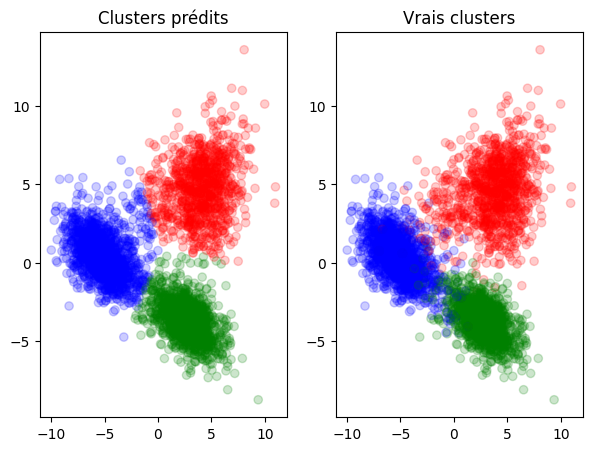

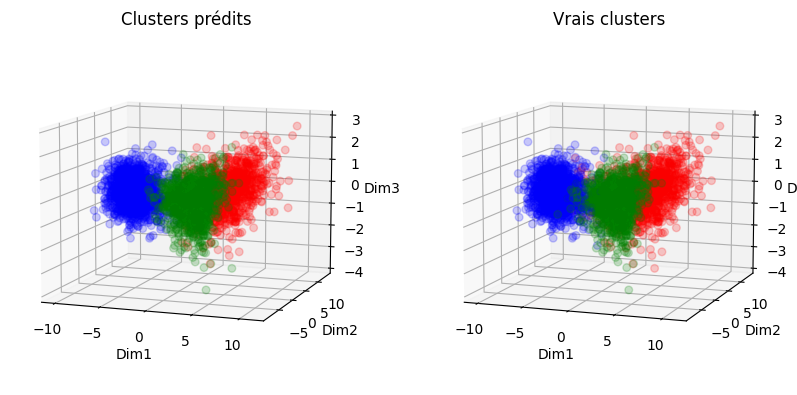

In [ ]:
# Récupération des objet R contenant les résultats
rkm_labels = np.array(robjects.r('rkm_result$cluster'))
rkm_result = np.array(robjects.r('rkm_result$obscoord'))

# Soustraction pour faire correspondre les valeurs issues de R à celles de python
rkm_labels = rkm_labels - 1

# Evaluation de la qualité du clustering
print_metrics(rkm_labels, y)

# Comparaison des clusters en 2D 
clust_viz_2D(rkm_result, rkm_labels)

# Comparaison des clusters en 3D
clust_viz_3D(rkm_result, rkm_labels, elev1=10, azim1=-70, elev2=10, azim2=-70)

Les clusters sont bien séparés mais les résultats ne sont pas meilleurs que ceux des méthodes utilisant UMAP avant le clustering.

## Deep KMeans

In [ ]:
# Approche simultanée avec Deep KMeans
dkm_result, dkm_result_labels = DKM(array_glove, n_clusters=3, n_components=3)

<ipython-input-68-b8ce86626ea5>:15: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input,


Starting autoencoder pretraining...


100%|██████████| 50/50 [01:41<00:00,  2.03s/it]
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [02:50<00:00,  8.53s/it]


NMI score:  0.8960563724300127
Accuracy:  0.008224106913389874
ARI:  0.9354676652531729


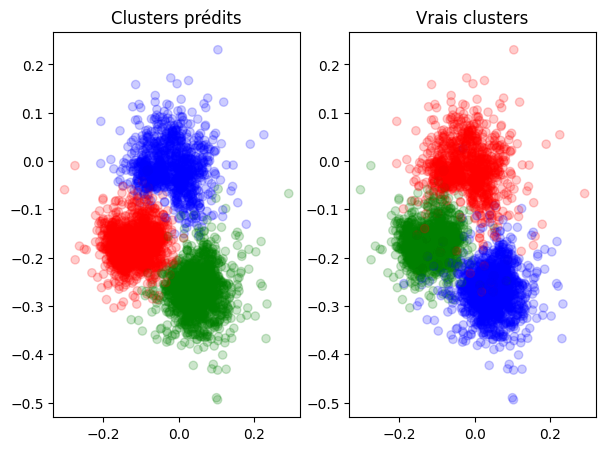

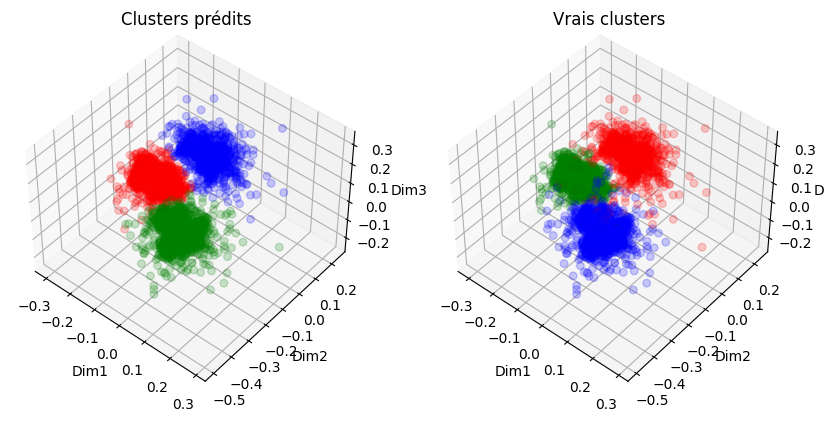

In [ ]:
# Evaluation de la qualité du clustering
print_metrics(dkm_result_labels, y)

# Comparaison des clusters en 2D 
clust_viz_2D(dkm_result, dkm_result_labels)

# Comparaison des clusters en 3D
clust_viz_3D(dkm_result, dkm_result_labels, elev1=45, azim1=-50, elev2=45, azim2=-50)

Les résulats sont meilleurs qu'avec RKM, les clusters sont plus distincts. Mais ce ne sont pas les meilleurs obtenus.

# Conclusion

In [ ]:
# Ajout des résultats des approches simultanées au tableau récapitulatif
tab_all = tab.reset_index()

new_rows = [{'index': 'RKM', 
             'NMI': normalized_mutual_info_score(rkm_labels, y),
             'Accuracy': accuracy_score(rkm_labels, y),
             'ARI': adjusted_rand_score(rkm_labels, y),
             'NMI-ARI mean': np.mean([normalized_mutual_info_score(rkm_labels, y),
                                      adjusted_rand_score(rkm_labels, y)])},
            {'index': 'DKM', 
             'NMI': normalized_mutual_info_score(dkm_result_labels, y),
             'Accuracy': accuracy_score(dkm_result_labels, y),
             'ARI': adjusted_rand_score(dkm_result_labels, y),
             'NMI-ARI mean': np.mean([normalized_mutual_info_score(dkm_result_labels, y),
                                      adjusted_rand_score(dkm_result_labels, y)])}]

tab_all = tab_all.append(new_rows, ignore_index=True).set_index('index')

# Affichage du tableau de synthèse des résultats
tab_all

<ipython-input-71-1b0d9a5b26f2>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  tab_all = tab_all.append(new_rows, ignore_index=True).set_index('index')


,NMI,Accuracy,ARI,NMI-ARI mean
index,,,,
Kmeans++,0.851172,0.372141,0.895813,0.873493
Kmedoids,0.809492,0.949884,0.860389,0.834940
Spherical Kmeans,0.835249,0.377538,0.881505,0.858377
CAH (simple),0.001106,0.375225,0.000087,0.000596
CAH (complet),0.396073,0.586739,0.247615,0.321844
CAH (moyen),0.002964,0.376510,0.000440,0.001702
CAH (Ward),0.910942,0.372655,0.947288,0.929115
PCA + Kmeans++,0.839202,0.960678,0.886311,0.862756
PCA + Kmedoids,0.498106,0.026214,0.418736,0.458421


In [ ]:
# Meilleure combinaison
tab_all[tab_all["NMI-ARI mean"]==tab_all["NMI-ARI mean"].max()]

,NMI,Accuracy,ARI,NMI-ARI mean
index,,,,
UMAP + Kmeans++,0.932574,0.987407,0.962335,0.947455
UMAP + Kmedoids,0.932574,0.373683,0.962335,0.947455
UMAP + Spherical Kmeans,0.932574,0.373683,0.962335,0.947455
UMAP + CAH (simple),0.932574,0.361604,0.962335,0.947455
UMAP + CAH (complet),0.932574,0.987407,0.962335,0.947455
UMAP + CAH (moyen),0.932574,0.006682,0.962335,0.947455
UMAP + CAH (Ward),0.932574,0.264713,0.962335,0.947455


Affichage du meilleur clustering (et le plus rapide)

NMI score:  0.932573621843416
Accuracy:  0.9874068362888717
ARI:  0.9623353889591596


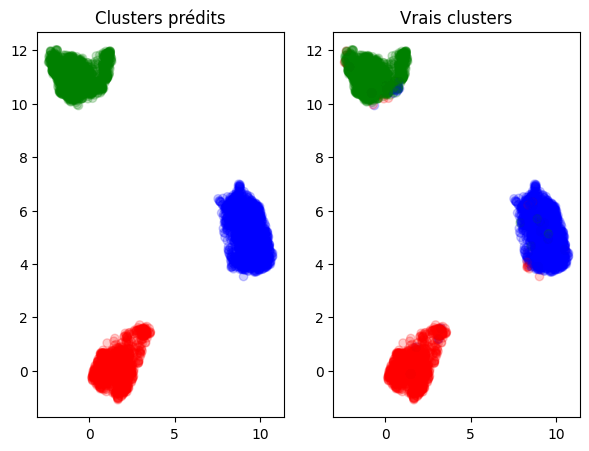

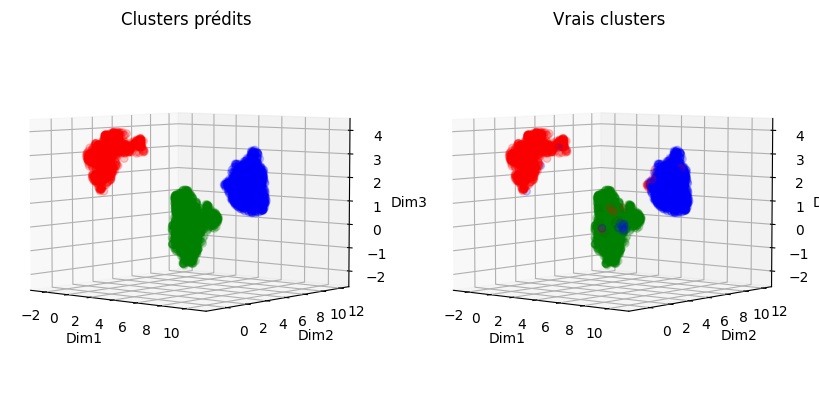

In [ ]:
# Comparaison des clusters en 2D 
clust_viz_2D(umap_result, umap_kmeans.labels_)

# Comparaison des clusters en 3D
clust_viz_3D(umap_result, umap_kmeans.labels_, elev1=5, azim1=-50, elev2=5, azim2=-50)

Les clusters sont de meilleure qualité qu'avec les embeddings Word2Vec. Ils sont plus denses et surtout mieux séparés. Quelques éléments restent classés dans un mauvais cluster. 